# 1. Dataset Cleaning and Combining

In [1]:
import pandas as pd
import numpy as np

## 1.1 Graduation Rate Preperation
`Notes: 03.02.18 - I have combined the graduation data with the demographic data from the 2010 census. The demographic data for each school district is saved in the csv file 'School_District_Demographics.csv' Only need to run this set of cells if I either change how the graduation data is cleaned or I need to combine it with different sets, not connected to demographic, school finance data.`

In [2]:
graduation_rates = pd.read_csv('Graduation_Rates.csv')

# fills all the null values in the dataframe. The null values represent data points that should be 0.
graduation_rates = graduation_rates.fillna(0)

In [3]:
# converts the string values of the rate columns to intergers.
def rate_cleaner(cell):
        """
        This function returns a numeric value for data in the graduation rate column of the premerged
        data set from the AT&T graduation rates data. Ranges were used for graduation rates in schools
        with class sizes of less than 300 during data collection to protect personal identities.
        This function converts the values to an integer datatype and standardizes graduation rates
        for all schools of similar size. PS indecates class size is less than 6 and cannot be reported.
        """
        
        if cell == 0:
            return 0
        
        # converts all cells with a range of two numbers (i.e. '65-75') to the average of the range.
        elif len(cell) == 5:
            left, right = cell.split('-')
            return round(int(left) + int(right))
        
        # converts any cell with less than ('L') to the average of the upper end and 0 (divides cell in half.)
        elif cell[0] == 'L':
            return round(int(cell[2:])/2)
            
        # converts any cell with greater than ('G') to the average of the lower end and 100.
        elif cell[0] == 'G':
            return round( (int(cell[2:]) + 100) / 2)
        
        # converts any cell with a length of 3 to the number (These are generally extreme values like less than 5%)
        elif len(cell) == 3:
            return int(cell[-1:])

        # This value is for schools that are too small to report on (Class size is less than 6 students).
        elif cell == 'PS':
            return 0
        
        # For schools with a class size of more than 300 students, graduation rates are reported as a percentage
        else:
            return int(cell)

# Applys rate cleaner to a specified dataframe columns.
def apply_rate_cleaner(df, col):
    df[col] = df[col].apply(rate_cleaner)

# Put all columns with 'RATE' in them into a list for cleaning.
rate_columns = [x for x in graduation_rates.columns if 'RATE' in x]

# for loops through rate columns and applys the rate_cleaner function.
for col in rate_columns:
    apply_rate_cleaner(graduation_rates, col)

## 1.2 Census Data Preparation
`Note: 03.02.18 - I have cleaned this data and taken the scalable demographic data from it. scalable defined as data that can be transformed by a multiplier to accurately represent demographic data for a school district (i.e total numbers of people and houses and not percentages). This data multiplied by a raio based off of the school_district/census_tract overlap dataset and mapped to a dictionary for each school district. This dictionary was used to map to 90% of the school districts in the graduation rate data.`

`Remaining questions:`

    1) What school district groups are not represented in the combined graduation_rate/demographic dataset?

In [4]:
# Loads Census data and fills the one missing value in the GIDTR column
census_data = pd.read_csv('Census_Data_2010.csv', encoding='latin1')

# This value is imputed from the state (6), county (730), and tract number (11000).
census_data['GIDTR'] = census_data['GIDTR'].fillna(673011000)

census_data = census_data.drop(9487)

In [5]:
# Function to clean money related columns, so that the dataframe row can scaled by a ratio and put into a dictionary.
def money_cleaner(cell):
    return int(cell.replace(',', '').strip('$'))

# columns to be cleaned so that the data can be scaled by a multiplier
columns_to_be_cleaned = [
    'Med_HHD_Inc_ACS_08_12',
    'Med_HHD_Inc_ACSMOE_08_12',
    'Aggregate_HH_INC_ACS_08_12',
    'Aggregate_HH_INC_ACSMOE_08_12',
    'Med_House_value_ACS_08_12',
    'Med_House_value_ACSMOE_08_12',
    'Aggr_House_Value_ACS_08_12',
    'Aggr_House_Value_ACSMOE_08_12'
]

# fills null values for all of these columns with 0 for the money cleaning function
census_data[columns_to_be_cleaned] = census_data[columns_to_be_cleaned].fillna('0')

# for loops through the columns and converts the values of each cell into an int
for col in columns_to_be_cleaned:
    census_data[col] = census_data[col].apply(money_cleaner)

In [6]:
# Creates a Dataframe of the money data (This will be used to calculate data on a school district level).
money_data_census = census_data[columns_to_be_cleaned]

# Adds State data for the money data.
money_data_census['State']  = census_data['State'].copy()

# Adds County data for the money data.
money_data_census['County'] = census_data['County'].copy()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [7]:
# Creates a dictionary of median values for each county in each state
values = {}

# loops through each unique state
for state in money_data_census['State'].unique():
    # intiates a dictionary entry for each state
    values[state] = {}
    # loops through each county in each state
    for county in money_data_census.loc[money_data_census['State'] == state]['County'].unique():
        # Calculates the median value for each county based on the values for the census tracts.
        values[state][county] = np.nanmedian(money_data_census.loc[(money_data_census['State'] == state)\
                                                                    & (money_data_census['County'] == county)].values,\
                                                                     axis=0)[:8]

In [8]:
def house_hold_income_imputer(row):
    if row['Med_HHD_Inc_ACS_08_12'] == 0:
        state = row['State']
        county = row['County']
        return values[state][county][0]
        
    else:
        return row['Med_HHD_Inc_ACS_08_12']

census_data['Med_HHD_Inc_ACS_08_12'] = census_data.apply(house_hold_income_imputer, axis=1)

In [13]:
def the_grand_imputer(df, cols):
    for count, col in enumerate(cols):
        def demographics_imputer(row):
            if row[col] == 0:
                state = row['State']
                county = row['County']
                return values[state][county][count]

            else:
                return row[col]

        df[col] = df.apply(demographics_imputer, axis=1)

In [33]:
# There are 16 sets of two rows with the same 'GIDTR' number. These rows have complementary data,
# so the rows were summed to create one row with a complete set of data.
# This step also removes the two non-numeric columns of data, State and County.
census_data_clean = census_data.groupby('GIDTR').sum()

# Resets the index for the cleaned up census dataframe.
census_data_clean = census_data_clean.reset_index()

# takes all of the scalable data (did not include any percentage based data).
scalable_census_data = census_data_clean.iloc[:,6:292]

# creates a dictionary of the scalable data with the census_tract number.
census_dictionary = dict(zip(census_data_clean['GIDTR'], scalable_census_data.values))

## 1.3 School Discrict / Tract Overlap Data Preperation
`Note: 03.02.18 - I have generated the census_tract number from the 'State', 'County', and 'tract' number columns in the School_District/Overlap Dataset. I used this to combine with the demographic data to create a dictionary of School_Distric_ID numbers (Leaid) to the sum of the demographic data of all the tracts in each School District.`

In [34]:
def census_code(row):
    
    # extracts the state number for each row and converts the number to a string.
    # The state number can be either 1 or 2 digits.
    state = str(row['State'])
    
    
    
    # extracts the county number for each row and convers the number to a string. The county number is three digits
    # long, so this function adds zeros to single and double digit county numbers to make the number three digits.
    if len(str(row['County'])) == 1:
        county = '00' + str(row['County'])
        
    if len(str(row['County'])) == 2:
        county = '0' + str(row['County'])
        
    if len(str(row['County'])) == 3:
        county = str(row['County'])
        
    
    
    # extracts the tract number for each row and convers the number to a string. The tract number is six digits
    # long, so this function adds zeros to three, four, and five digit tract numbers to make the number six digits.
    if len(str(row['Tract Code'])) == 3:
        tract = '000' + str(row['Tract Code'])

    if len(str(row['Tract Code'])) == 4:
        tract = '00' + str(row['Tract Code'])
           
    if len(str(row['Tract Code'])) == 5:
        tract = '0' + str(row['Tract Code'])
           
    if len(str(row['Tract Code'])) == 6:
        tract = str(row['Tract Code'])
        
    
    
    # This adds the string values for the numbers together (concatenates the numbers) to make a complete
    # 10 or 11 digit census tract number.
    census_code = state + county + tract
    
    return int(census_code)

In [35]:
school_disctrict_tracts = pd.read_csv('SD_TRACT_MAPPING2010.csv')

school_disctrict_tracts['census_tract'] = school_disctrict_tracts.apply(census_code, axis=1)

## 1.4 Creating New Dataframe of Demographic Data for each school district
`Note: 03.02.18 - I iterated through each row in the School_Distrct/Census_Tract Overlap Dataframe (school_district_tracts), where I extracted the school_id ('Leaid'), the ratio ('Percentage' divided by 100), and the census_tract number ('census_tract) from the school_district_tracts. All generated census_tract numbers extracted from the Overlap Dataframe that were not in the census dataset, were appended to a list of potentially wrong tract numbers. If the generated census tract number was found in the census data, the scalable data for that row was multiplied by the ratio. The for loop will first try to find the school_id_number in the dictionary. If that given school_id alrady has a dictionary key, the scaled census tract row data will be summed with the values already associated with the school_id key. If the dictionary does not contain a key for a given school_id, it will create one based off of the scaled data. This dictionary was then converted to a dataframe and saved as a csv file: ('School_District_Demographics.csv'). `

`Remaining Questions:`

    1. Where are the census_tracts that could not be found in the census data?

In [36]:
# Creates a set of census_tract numbers from the census data and the overlap data. The census_tract numbers unique
# to the overlap dataset are census_tracts not found in the Census Data. These were either not generated correctly,
# were incorrectly entered into the census data, or are completely missing.
a = set(census_data['GIDTR'])
b = set(school_disctrict_tracts['census_tract'])
tracts_not_in_census = b.difference(a)

# establishes a list for missing census_tract numbers.
wrong_tract_num = []

# establishes a dictionary 
out = {}

# interates through each row of school district / tract overlap dataframe and extracts school_id (leaid),
# tract_percentage overlap divided by 100 (ratio), and census tract number (census tract).
for row in range(school_disctrict_tracts.shape[0]):    
    school    = school_disctrict_tracts.iloc[row]['Leaid']
    ratio     = (school_disctrict_tracts.iloc[row]['Percentage']/100)
    tract_num = school_disctrict_tracts.iloc[row]['census_tract']
    
    # finds generated census tract from the overlap dataframe for which the census data does not have information for.
    if tract_num in tracts_not_in_census:
        wrong_tract_num.append(tract_num)
        continue
    
    # for generated census tract numbers that are in the census data, the for loop first tries add the scaled census
    # data (demographic data modified by the ratio) to the dictionary based on school_id. If dictionary entry exists,
    # the except step establishes a dictionary entry for the school id with the scaled census data.
    else:
        try:
            out[school] = np.nansum([out[school], np.multiply(census_dictionary[tract_num], ratio)], axis=0)

        except:
            out[school] = np.multiply(census_dictionary[tract_num], ratio)

        # tracks progress through the list of 105,000 rows of the overlap data (every 10,000)
        if row % 10000 == 0:
            print(row, 'done!')

# converts the dictionary to a dataframe.
demographics_school_district = pd.DataFrame(out)

demographics_school_district.to_pickle('demographics_for_school_district.pickel')

0 done!
10000 done!
20000 done!
30000 done!
40000 done!
50000 done!
60000 done!
70000 done!
80000 done!
90000 done!
100000 done!


In [68]:
index = column_index_finder(census_data_clean, columns_to_be_cleaned)

census_dictionary[1005950300]

In [77]:
census_data_clean.shape

(74004, 548)

In [78]:
def column_index_finder(df, cols):
    index = [count for count, col in enumerate(df.columns) if col in cols]
    return index

In [82]:
census_tract_dictionary = dict(zip(census_data_clean['GIDTR'], census_data_clean.values))

In [84]:
a = set(census_data['GIDTR'])
b = set(school_disctrict_tracts['census_tract'])
tracts_not_in_census = b.difference(a)

income_by_tract = {}


for row in range(school_disctrict_tracts.shape[0]):    
    school    = school_disctrict_tracts.iloc[row]['Leaid']
    tract_num = school_disctrict_tracts.iloc[row]['census_tract']
    
    if tract_num in tracts_not_in_census:
        continue
    
    else:
        try:
            income_by_tract[school] = np.vstack((income_by_tract[school], census_tract_dictionary[tract_num]))


        except:
            income_by_tract[school] = census_tract_dictionary[tract_num]

        if row % 10000 == 0:
            print(row, 'done!')

0 done!
10000 done!
20000 done!
30000 done!
40000 done!
50000 done!
60000 done!
70000 done!
80000 done!
90000 done!
100000 done!


In [40]:
# Transposes the dataframe and adds columns names,  resets the index and renames the former index column as 'leaid'.
demographics_school_district = demographics_school_district.T

demographics_school_district.columns = scalable_census_data.columns

demographics_school_district = demographics_school_district.reset_index()

demographics_school_district.rename(columns={'index': 'Leaid'}, inplace=True)

demographics_school_district.to_csv('School_District_Demographics.csv')

## 1.5 Combining Demographic Data with Graduation Rate Data
`Note 03.02.18 - I combined the graduation rate data with the the school district demographics. I used an inner join to merge the two dataframes on school disctrict id (leaid).`

In [41]:
demographics_school_district = pd.read_csv('School_District_Demographics.csv')

combined_demographics_graduation_rates = pd.merge(left=demographics_school_district, right=graduation_rates,\
                                                  left_on='Leaid', right_on='leaid11', how='inner')

## 1.6 Revenue and Expense Data by School
`Note: 03.02.18 - I downloaded data files from the census bureau. These data files were 4 data files from 2013 that detailed school finances by school district. SS1300A15 details school district revenue sources, SS1300A16 details school district expenses, SS1300A17 details the distribution of school district funding, and SS1300A18 details school district spending per pupil. These four data files had financial information for 13,400 school districts. I dropped all columns with nan values as these columns contained only nan values for all school districts. I renamed the columns based off of the data file information, detailed on the census website. The columns were in order of the listed columns on the supplemental information for all Datafiles except the expenses data file, which were out of order. Column order was inferred by the order of per pupil spending which had the same columns as the expense data file. The four data files were combined using the school_finance_merger function which establishes the first data file as a the df to be merged on and then iterates through the subsequent dataframes to merge them on ['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR']. The new dataframe of the four combined datafiles was exported to a csv format and saved as ('School_Finance_Data.csv').`

In [42]:
# Loads the four data files using a | delimiter as dataframes.
school_disctrict_rev = pd.read_csv('SS1300A15.dat', delimiter='|')

school_disctrict_expense = pd.read_csv('SS1300A16.dat', delimiter='|')

school_disctrict_distribution = pd.read_csv('SS1300A17.dat', delimiter='|')

school_disctrict_per_pupil_spending = pd.read_csv('SS1300A18.dat', delimiter='|')

In [43]:
# drops columns with null values.
school_disctrict_rev = school_disctrict_rev.dropna(axis=1)

school_disctrict_expense = school_disctrict_expense.dropna(axis=1)

school_disctrict_distribution = school_disctrict_distribution.dropna(axis=1)

school_disctrict_per_pupil_spending = school_disctrict_per_pupil_spending.dropna(axis=1)

In [44]:
# list of renamed columns for each datafile based off of the supplemental info for each file.
rev_renamed          = ['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR', 'enroll', 'total_rev', 'total_fed', 't1_fed',
                        'special_fed', 'nutrition_fed', 'non_spec_fed', 'total_state', 'gen_formula_state',
                        'special_state', 'transportation_state', 'non_spec_state', 'total_local', 'taxes_local',
                        'property_tax_local', 'parent_government_local', 'cities_county_local', 'other_schools_local',
                        'charges_local', 'other_local']

expenses_renamed     = ['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR', 'enroll_expnd', 'total_expnd', 'current_expnd', 
                        'salary_wage_expnd', 'employee_benefits_expnd', 'instruction_total_expnd',
                        'instruction_salary_wage_expnd', 'instruction_employee_benefits_expnd',
                        'support_total_expnd', 'pupil_support_expnd', 'instructional_support_expnd',
                        'services_general_administration_expnd', 'services_school_administration_expnd',
                        'other_non_spec_expnd', 'functions_other_expnd', 'capital_outlay_expnd',
                        'intergovernmental_expnd', 'interest_on_debt_expnd']

distribution_renamed = ['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR', 'enrollment_distribution', 'total_rev_percent',
                        'total_rev_fed_percent', 't1_rev_fed_percent', 'total_state_percent',
                        'general_assistance_formula_state_rev_percent', 'total_local_rev',
                        'taxes_parent_government_local_rev_percent', 'other_local_government_rev_percent',
                        'charges_local_rev_percent']

per_pupil_renamed    = ['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR', 'enroll_per_pupil', 'total_expnd_per_pupil',
                        'objects_salary_wage_per_pupil', 'objects_employee_benefits_per_pupil',
                        'instruction_total_per_pupil', 'instruction_salary_wages_per_pupil', 
                        'instruction_employee_benefits_per_pupil', 'suport_services_total_per_pupil', 
                        'pupil_support_per_pupil', 'instruction_staff_support_per_pupil', 
                        'services_general_admin_per_pupil', 'services_school_admin_per_pupil']

In [45]:
# establishes a list of the dataframes.
dfs = [school_disctrict_rev, school_disctrict_expense, school_disctrict_distribution,
       school_disctrict_per_pupil_spending]

# establishes a list of the column_rename lists in order of the the dataframe list above.
list_of_renamed_columns = [rev_renamed, expenses_renamed, distribution_renamed, per_pupil_renamed]

# zips together the two lists (dataframs and rename columns) and loops through each df/list of column names
# and renames the columns
for df, rename_list in zip(dfs, list_of_renamed_columns):
    df.columns = rename_list

In [46]:
# a function for merging the four dataframes.
def school_finance_merger(list_of_dfs):
    
    # establishes the first df as df1 which will be merged on with the subsequent dfs in the list.
    df1 = list_of_dfs[0]
    
    # loops through the remaining dfs and merges them on df1 on common columns.
    # Overwrites df1 with the combined df for each df.
    for df2 in list_of_dfs[1:]:
        
        df1 = pd.merge(left=df1, right=df2, on=['GEOTYPE', 'ST', 'GEO_ID', 'GEO_TTL', 'YEAR'])
        
    return df1

# merges the four dataframes together using the school_finance_merger function
school_finance_df = school_finance_merger(dfs)

In [47]:
school_finance_df.to_csv('School_Finance_Data.csv')

## 1.7 Combining the Graduation Rate/Demographic dataframe with Finance Data
`Note: 03.02.18 - School Districts in the school finance data from the census bereau have a unique 'GEO_ID' number. The last seven digits of the 'GEO_ID' number correspond to the unique 'Leaid' number for school districts used to merge previous datasets. The school_id_extracter function takes the last seven numbers of the GEO_ID and converts the number into an interger (drops the initial 0 if school ID is only 6 digits). The function was used to create a new column, 'leaid' in the school finance data. The financial data and the combined graduation rates/School district data made in step #5, were then merged on 'leaid' number.`

`Remaining Questions:`

    1. What are the school districts that are not represented in the school finance data and how does that affect the overall data?

In [48]:
# generates school_id number from GEO_ID
def school_id_extracter(cell):
    return int(cell[-7:])

school_finance_df['leaid'] = school_finance_df['GEO_ID'].apply(school_id_extracter)

# merges finace data and the combined school_disctrict/demographic data on school_id
finance_demographics_graduation_rate_combined = pd.merge(left=combined_demographics_graduation_rates,\
                                                         right=school_finance_df,\
                                                         left_on='Leaid', right_on='leaid')

finance_demographics_graduation_rate_combined.to_csv('finance_demographics_graduation_rate_combined.csv')

## 1.8 House Hold Income and Home Values

In [151]:
index = column_index_finder(census_data_clean, columns_to_be_cleaned)

median_income_data = {}

for school in finance_demographics_graduation_rate_combined['Leaid']:
    if income_by_tract[school].shape == (548,):
        data = income_by_tract[school][index]
        median_income_data[school] = data
    else:
        try:
            data = np.nanmedian(income_by_tract[school], axis=0)[index]
            median_income_data[school] = data
        except:
            print(school, 'problem')

[239, 240, 241, 242, 274, 275, 276, 277]

In [168]:
median_income_data_df = pd.DataFrame(median_income_data, index=range(8))

median_income_data_df = median_income_data_df.T

median_income_data_df.columns = columns_to_be_cleaned

median_income_data_df.head()

median_income_data_df.to_csv('030918_median_census_money_values.csv')

## 1.9 School_id and States

In [ ]:
# Creates a set of census_tract numbers from the census data and the overlap data. The census_tract numbers unique
# to the overlap dataset are census_tracts not found in the Census Data. These were either not generated correctly,
# were incorrectly entered into the census data, or are completely missing.
a = set(census_data['GIDTR'])
b = set(school_disctrict_tracts['census_tract'])
tracts_not_in_census = b.difference(a)

# establishes a list for missing census_tract numbers.
wrong_tract_num = []

state_school_ID_dictionary = {}

for row in range(school_disctrict_tracts.shape[0]):
    school_id = school_disctrict_tracts.iloc[row]['Leaid']
    census_tract = school_disctrict_tracts.iloc[row]['census_tract']
    
    # finds generated census tract from the overlap dataframe for which the census data does not have information for.
    if census_tract in tracts_not_in_census:
        wrong_tract_num.append(census_tract)
        pass
    
    # for generated census tract numbers that are in the census data, the for loop first tries add the scaled census
    # data (demographic data modified by the ratio) to the dictionary based on school_id. If dictionary entry exists,
    # the except step establishes a dictionary entry for the school id with the scaled census data.
    else:
        state = census_data.loc[census_data['GIDTR'] == census_tract]['State_name']

        state_school_ID_dictionary[school_id] = state.values

state_school_ID_dictionary[621000] = np.array(['California'])

school_id_and_state = pd.DataFrame(state_school_ID_dictionary).T.reset_index().rename(columns={'index': 'Leaid',\
                                                                                               0:'State_name'})

school_id_and_state.to_csv('school_id_to_state.csv')

# 2. Modeling

In [99]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, RFE, RFECV
from sklearn.feature_selection import f_regression
import seaborn as sns
from sklearn.preprocessing import minmax_scale, StandardScaler
from scipy import stats

plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

##  2.1 Data for model

In [ ]:
grad_rates = pd.read_csv('030918_graduation_rates.csv')
income_home = pd.read_csv('030918_median_census_money_values.csv')
district_demo = pd.read_csv('030918_School_District_Demographic_percentages.csv')
finance = pd.read_csv('030918_School_Finance_Data.csv')

In [ ]:
def school_id_extracter(cell):
    return int(cell[-7:])

In [ ]:
finance['Leaid'] = finance['GEO_ID'].apply(school_id_extracter)

grad_rates = grad_rates.drop('Unnamed: 0', axis=1)._get_numeric_data()

income_home = income_home.drop('Unnamed: 0', axis=1)

district_demo = district_demo.drop('Unnamed: 0', axis=1)

finance = finance.drop('Unnamed: 0', axis=1)._get_numeric_data()

grad_rates.rename(columns={'leaid11': 'Leaid'}, inplace = True)

In [3]:
# a function for merging the four dataframes.
def df_merger(list_of_dfs, on_col):
    
    # establishes the first df as df1 which will be merged on with the subsequent dfs in the list.
    df1 = list_of_dfs[0]
    
    # loops through the remaining dfs and merges them on df1 on common columns.
    # Overwrites df1 with the combined df for each df.
    for df2 in list_of_dfs[1:]:
        
        df1 = pd.merge(left=df1, right=df2, on=on_col)
        
    return df1

dfs = [grad_rates, income_home, district_demo, finance]

combined_df = df_merger(dfs, 'Leaid')

combined_df = combined_df.fillna(0)

model_df = combined_df.loc[combined_df['ALL_COHORT_1112'] > 60]

In [ ]:
combined_df['diversity_delta'] = combined_df['percent_MWH_COHORT_1112']\
                                 - combined_df['total_district_percent_NH_White_alone_CEN_2010']

diversity_delta_df = combined_df[['Leaid', 'diversity_delta']]

In [ ]:
grad_col = [col for col in grad_rates.columns if 'percent' in col]
grad_col.append('Leaid')
grad_col.append('ALL_RATE_1112')

grad_rates_for_model = grad_rates.loc[grad_rates['ALL_COHORT_1112'] > 60][grad_col]

In [ ]:
income_col = [col for col in income_home.columns if 'MOE' not in col]

income_home_for_model = income_home[income_col]

In [ ]:
demo_col = [col for col in district_demo.columns if 'percent' in col]
demo_col.append('Leaid')

district_demo_for_model = district_demo[demo_col]

In [ ]:
enrollment = [col for col in finance if 'enroll' not in col]

finance_col = [col for col in enrollment if col not in ['GEOTYPE', 'ST', 'YEAR']]

finance_for_model = finance[finance_col]

In [4]:
dfs = [grad_rates_for_model, income_home_for_model, district_demo_for_model, finance_for_model]

combined = df_merger(dfs, 'Leaid')

super_combined = pd.merge(left=combined, right=diversity_delta_df, on='Leaid')

## 2.2 The Primary Model

In [5]:
no_rate = [col for col in super_combined.columns if 'RATE' not in col]
features = [col for col in no_rate if col != 'Leaid']
X = super_combined[features]
y = super_combined['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2018, test_size=0.1)

rf = RandomForestRegressor()

params = {
    'n_estimators': [100],
    'max_depth': [None],
    
}

gs = GridSearchCV(rf, params, n_jobs=-1, verbose=1)

gs.fit(X_train, y_train)

print(gs.best_score_)
gs.best_params_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:  1.4min finished


0.575050350251


{'max_depth': None, 'n_estimators': 100}

In [6]:
gs.score(X_test, y_test)

0.52035001570622041

In [1]:
gs.score(X_test, y_test)

NameError: name 'gs' is not defined

In [7]:
feature_importances_rf_reg_30n_none = pd.DataFrame(gs.best_estimator_.feature_importances_,\
                                                   index=X.columns).sort_values(by=0, ascending=False)

feature_importance = feature_importances_rf_reg_30n_none.reset_index()

top_30 = feature_importances_rf_reg_30n_none.index[:30]

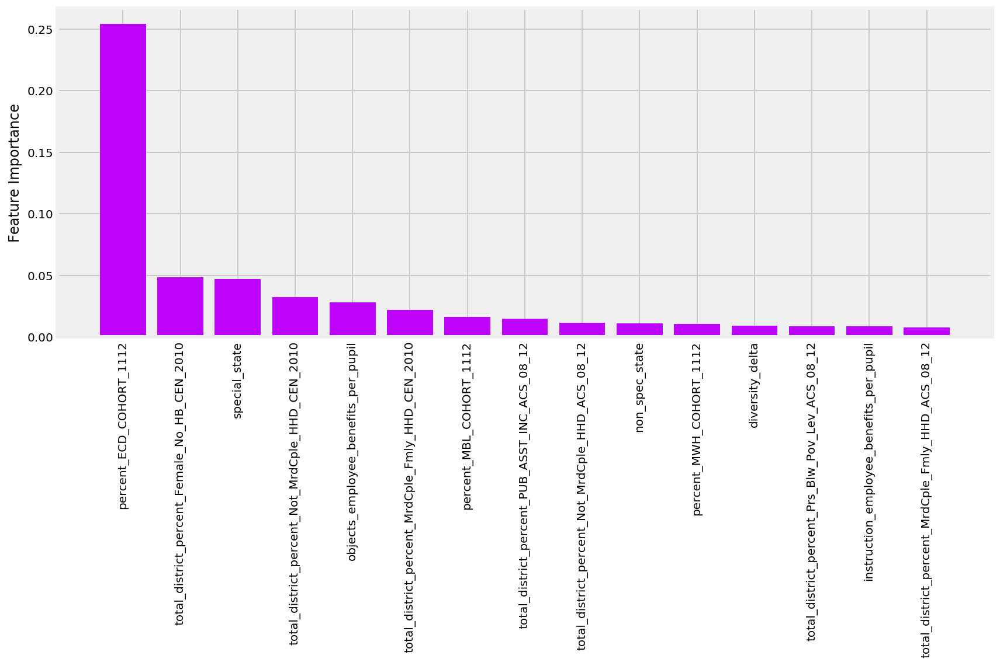

In [8]:
plt.figure(figsize=(12, 8))
plt.bar(np.arange(15), feature_importances_rf_reg_30n_none[:15][0], color='xkcd:bright purple')
plt.xticks(np.arange(15), feature_importances_rf_reg_30n_none.index[:15], rotation=90);
plt.ylabel('Feature Importance')
plt.tight_layout()
plt.savefig('/Users/adam/dsi-west3/Projects/project-3/Figures/feature_importance')

In [107]:
def subplot_scatter_plotter(df, features,\
                            y_comparison_col,\
                            nrows=1,
                            ncols=1,\
                            c='xkcd:bright purple',\
                            cmap=None,\
                            title='title'):
    
    if ncols > 1 and nrows > 1:
        ax_dictionary = {}
        count = 0
        for i in range(nrows):
            for x in range(ncols):
                ax_dictionary[count] = (i, x)
                count = count + 1
                
    if nrows == 1:
        ax_dictionary = {}
        count = 0
        for i in range(ncols):
            ax_dictionary[count] = i
            count = count + 1
            
    if ncols == 1:
        ax_dictionary = {}
        count = 0
        for i in range(nrows):
            ax_dictionary[count] = i
            count = count + 1
                
    fig, ax = plt.subplots(nrows, ncols, figsize=((ncols*5), (nrows*5)), sharey=True)
    
#     plt.suptitle(title, fontsize=30, weight='bold', y=.98)
    plt.subplots_adjust(hspace=0.5)
    
    for count, feature in enumerate(features):
        ax_coord = ax_dictionary[count]
        axes = ax[ax_coord].scatter(x=df[feature], y=df[y_comparison_col], c=c, cmap=cmap, alpha=0.5)
        ax[ax_coord].set_xlabel(f'{feature}', weight='bold')
        ax[ax_coord].set(ylabel=f'{y_comparison_col}') 
#         plt.colorbar(aspect=50, cax=x[ax_coord])

        slope, intercept, r_value, p_value, std_err = stats.linregress(super_combined[feature], 
                                                                       super_combined[y_comparison_col])
        line = slope * super_combined[feature] + intercept
        ax[ax_coord].plot(super_combined[feature], line, color='red', alpha=0.3)

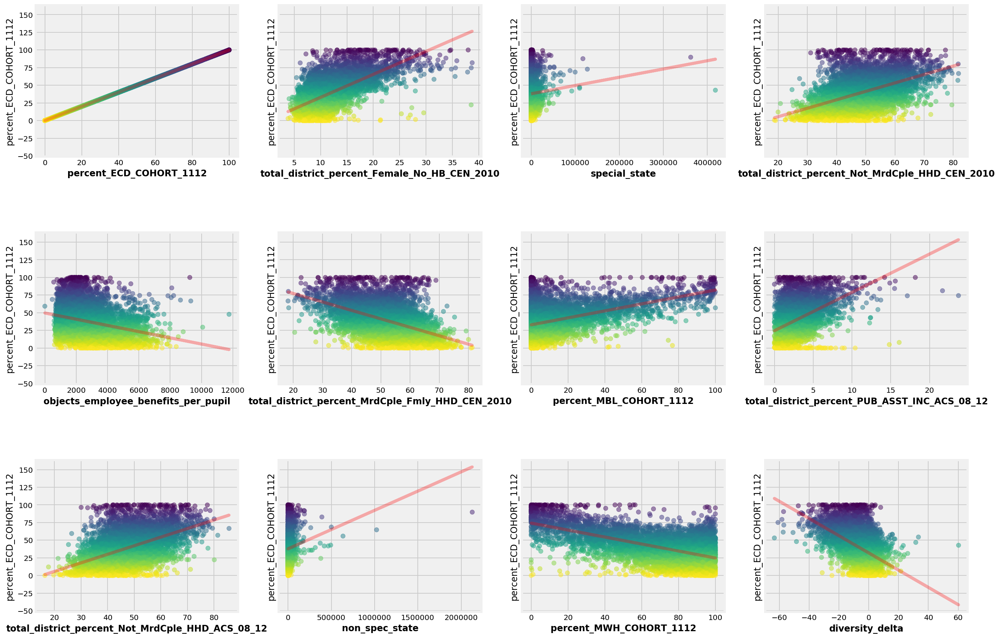

In [109]:
subplot_scatter_plotter(df               = super_combined,
                        features         = feature_importances_rf_reg_30n_none.index[0:12],
                        y_comparison_col = 'percent_ECD_COHORT_1112',
                        nrows            = 3,
                        ncols            = 4,
                        c                = super_combined['percent_ECD_COHORT_1112'],
                        cmap             ='viridis_r',
                        title            = 'Feature Importance and percent_ECD_COHORT'
                       )
# plt.tight_layout()
plt.savefig('Figures/Top_12_features_and_ECD')

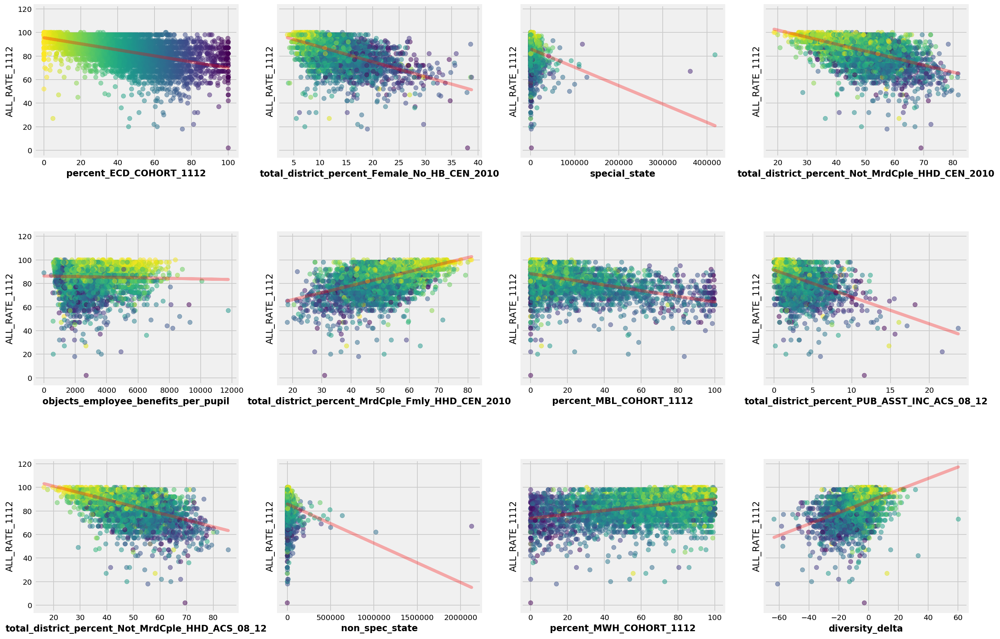

In [110]:
subplot_scatter_plotter(df               = super_combined,
                        features         = feature_importances_rf_reg_30n_none.index[0:12],
                        y_comparison_col = 'ALL_RATE_1112',
                        nrows            = 3,
                        ncols            = 4,
                        c                = super_combined['percent_ECD_COHORT_1112'],
                        cmap             ='viridis_r',
                        title            = 'Feature Importance and percent_ECD_COHORT'
                       )
# plt.tight_layout()
plt.savefig('Figures/Top_12_features_and_RATE')

In [113]:
cohort_col  = [col for col in grad_rates.columns if 'COHORT' in col and 'percent' not in col and 'ALL' not in col]
percent_col = [col for col in grad_rates.columns if 'percent' in col]
rate_col    = [col for col in grad_rates.columns if 'RATE' in col and 'ALL' not in col]

In [13]:
diversity_graduation_rate = pd.merge(left=grad_rates, right=diversity_delta_df, on='Leaid')

In [15]:
# sum of all students in the dataset attending schools of at least 30 students or more
all_students = diversity_graduation_rate.loc[diversity_graduation_rate['ALL_COHORT_1112'] > 30]['ALL_COHORT_1112'].sum()

# sum of all economically disadvantaged students in the dataset attending schools of at least 30 students or more
ecd_students = diversity_graduation_rate.loc[diversity_graduation_rate['ALL_COHORT_1112'] > 30]['ECD_COHORT_1112'].sum()

# percent of econimically disadvantaged students in the dataset attending schools of at least 30 students or more
ecd_percent = ecd_students/all_students * 100

# total population of white students
mwh_students = diversity_graduation_rate.loc[diversity_graduation_rate['ALL_COHORT_1112'] > 30]['MWH_COHORT_1112'].sum()

# percentage of white students
mwh_percent = mwh_students/all_students * 100

# new df to find overall demographics
overall_demo = pd.merge(grad_rates, district_demo, on='Leaid')

# Total population represented in the data.
total_pop = overall_demo['Tot_Population_CEN_2010'].sum()

# Total population of white pople in the data.
white_pop = overall_demo['NH_White_alone_CEN_2010'].sum()

# percentage of people in the census that are white.
percent_white = white_pop / total_pop * 100

# the percentage difference of the white students in public school of 30 students or more in the data 
# and the percentage of white people in the community. i.e. the resting difference between school district demographics
# and the community demographics.
diversity_correction = mwh_percent - percent_white

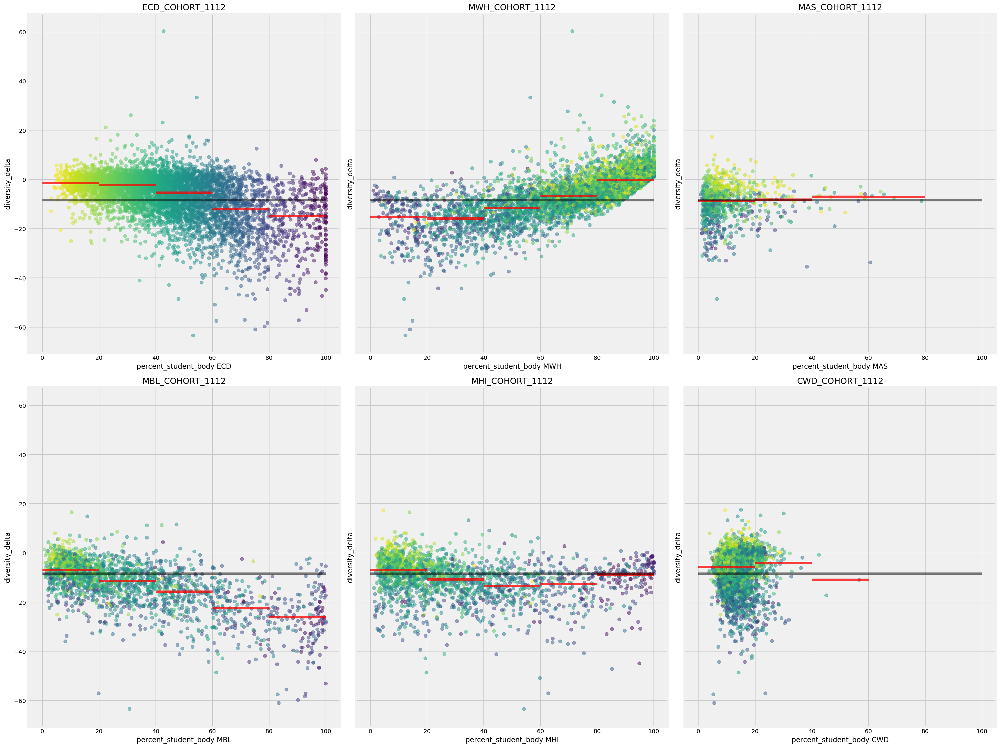

In [698]:
cols_for_diversity_delta = ['ECD_COHORT_1112',
                            'MWH_COHORT_1112',
                             'MAS_COHORT_1112',
                             'MBL_COHORT_1112',
                             'MHI_COHORT_1112',
                             'CWD_COHORT_1112']
percent_cols_for_diversity_delta = ['percent_ECD_COHORT_1112',
                                    'percent_MWH_COHORT_1112',
                                    'percent_MAS_COHORT_1112',
                                    'percent_MBL_COHORT_1112',
                                    'percent_MHI_COHORT_1112',
                                    'percent_CWD_COHORT_1112']

fig, ax = plt.subplots(2, 3, sharey=True, figsize=(24, 18))

# plt.suptitle('Differences in School District and Community Demographics\n(school_percentage - community_percentage)')

for count, col in enumerate(cols_for_diversity_delta):
    rate = percent_cols_for_diversity_delta[count]
    df2 = diversity_graduation_rate.loc[diversity_graduation_rate[col] > 30]
    name = col[:3] 
    color = df2['percent_ECD_COHORT_1112']
    
    ax_list = [(0,0), (0,1), (0,2), (1,0), (1,1), (1,2)]
    
    ax[ax_list[count]].scatter(y=df2['diversity_delta'], x=df2[rate], alpha=0.5, c=color, cmap='viridis_r')
    ax[ax_list[count]].set(ylabel=f'diversity_delta')
    ax[ax_list[count]].set(xlabel=f'percent_student_body {name}')
    ax[ax_list[count]].set_title(f'{col}')


    for num in [20, 40, 60, 80, 100]:
        avg_div = df2.loc[(df2[rate] >= (num - 20))\
                          & (df2[rate] < num)]['diversity_delta'].median()

        ax[ax_list[count]].hlines(y=avg_div, xmin=(num - 20), xmax=num, alpha=0.75, colors='red')

    ax[ax_list[count]].hlines(y=diversity_correction, xmin=0, xmax=100, alpha=0.5)
    
plt.tight_layout()
plt.savefig('./Figures/Diversity_delta_and_groups')

In [119]:
school_id_state_name = pd.read_csv('school_id_to_state.csv')
grad_rate_states = pd.merge(grad_rates, school_id_state_name[['Leaid', 'State_name']], on='Leaid')

In [120]:
def by_state_data(df, total_cohort_col):
    
    name = total_cohort_col[:3]
    
    percentage_cols = ['MAM_RATE_1112', 'MAS_RATE_1112', 'MBL_RATE_1112', 'MHI_RATE_1112', 'MTR_RATE_1112', 
                       'MWH_RATE_1112', 'CWD_RATE_1112', 'ECD_RATE_1112', 'LEP_RATE_1112']
    
    percentage_col = [col for col in percentage_cols if name in col]
    
    df = df.loc[df[total_cohort_col] > 60]

    # Graduated students in Cohort
    df[f'graduated_{name}_students'] = df[total_cohort_col] * df[percentage_col[0]] / 100 # group of interest
    df['graduated_ALL_cohort'] = (df['ALL_COHORT_1112'] * df['ALL_RATE_1112'] / 100) # All students
    
    # group by state
    df = df.groupby('State_name').sum()
    
    # students not in group (CAN DO AFTER GROUPBY)
    df[f'non_{name}_students'] = df['ALL_COHORT_1112'] - df[total_cohort_col]
    df[f'graduated_non_{name}_students'] = df['graduated_ALL_cohort'] - df[f'graduated_{name}_students']
    
    # Percent graduation
    df[f'percent_graduation_{name}'] = df[f'graduated_{name}_students'] / df[total_cohort_col] * 100
    df['percent_graduation_ALL'] = df['graduated_ALL_cohort'] / df['ALL_COHORT_1112'] * 100
    df[f'percent_graduation_non_{name}'] = df[f'graduated_non_{name}_students'] / df[f'non_{name}_students'] * 100
    df['percent_ECD_of_students'] = df['ECD_COHORT_1112'] / df['ALL_COHORT_1112'] * 100
    
    # Graduation delta
    df[f'{name}_graduation_delta'] = df[f'percent_graduation_{name}'] - df[f'percent_graduation_non_{name}']
    
    return df

In [121]:
def by_state_plotter(df, total_cohort_col, scale_size=False, size=800, title='title'):
    
    if df.index.contains('District of Columbia'):
        df = df.drop('District of Columbia')
    
    name          = total_cohort_col[:3]
    delta_column  = [col for col in df.columns if 'delta' in col][0]
    max_cohort    = df[total_cohort_col].max()
    max_delta     = df[delta_column].max()
    min_delta     = df[delta_column].min()
    max_grad_rate = df['percent_graduation_ALL'].max()
    min_grad_rate = df['percent_graduation_ALL'].min()
    
    state_labels = {}

    for count, state in enumerate(df.index):
        x = df['percent_graduation_ALL'][count]
        y = df[delta_column][count]
        state_labels[state] = (x, y)
    
    if scale_size == True:
        size = (df[total_cohort_col] * 3000 / max_cohort) + 100
    
    else:
        size = size

    plt.figure(figsize=(16, 16))
    plt.scatter(x=df['percent_graduation_ALL'],
                y=df[delta_column],
                alpha=0.6,
                s=size,
                c=df['percent_ECD_of_students'],
                cmap='viridis_r')
    
    for state in state_labels:
        xy = state_labels[state]
        plt.annotate(state, xy, fontsize=12)
    plt.vlines(df['percent_graduation_ALL'].median(), min_delta, max_delta, alpha=0.25)
    plt.hlines(df[delta_column].median(), min_grad_rate, max_grad_rate, alpha=0.25)
    plt.title(title)
    plt.xlabel(f'Overall graduation rate of schools with more than 60 {name} students in Cohort')
    plt.ylabel(f'{name} student graduation rate difference from the non-ECD student graduation rate')

    cbar = plt.colorbar(aspect=50)
    cbar.set_label('percent ECD students', rotation=270, labelpad=15)
    
    if scale_size == True:
        legend_labels = ['1000', '50000', '250000']

        l3 = plt.scatter([],[],s=(1000 * 3000/max_cohort) + 100, c='k')
        l4 = plt.scatter([],[],s=(50000 * 3000/max_cohort) + 100, c='k')
        l5 = plt.scatter([],[],s=(250000 * 3000/max_cohort) + 100, c='k')

        plt.legend([l3, l4, l5], legend_labels, ncol=5, bbox_to_anchor=(0.45, 0.98), handlelength=4,
                  borderpad = 2.5, title='Number of ECD Students', handletextpad=1, frameon=True, labelspacing=3)

In [122]:
def data_plotter_by_state(df, total_cohort_col, scale_size=False, size=800, title='title'):
    df = by_state_data(df, total_cohort_col)
    by_state_plotter(df, total_cohort_col, scale_size=scale_size, size=800, title=title)

`The vertical grey line represents the median graduation rate of the states on the graph. The horizontal line represents the median difference in graduation for the particular group of interest. The color represents the percentage of economically disadvantaged students in each state in schools that have more than 60 students of the selected group.`

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


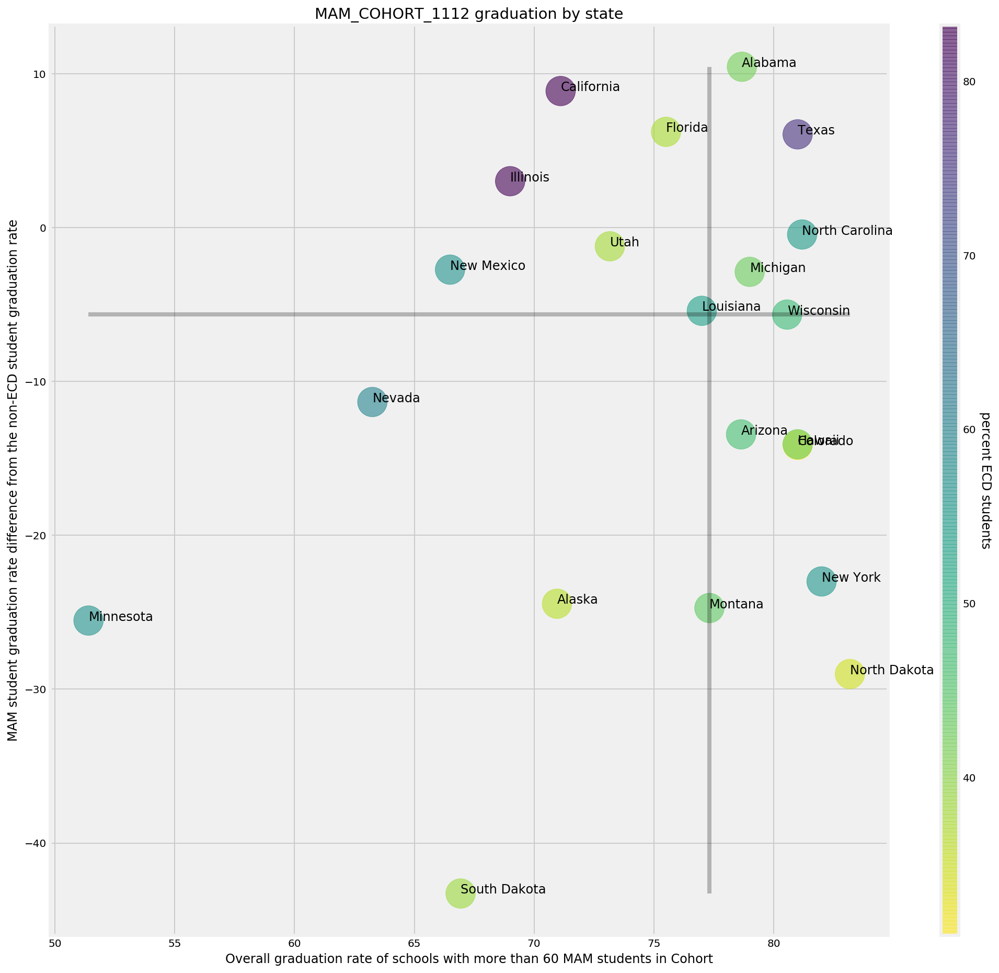

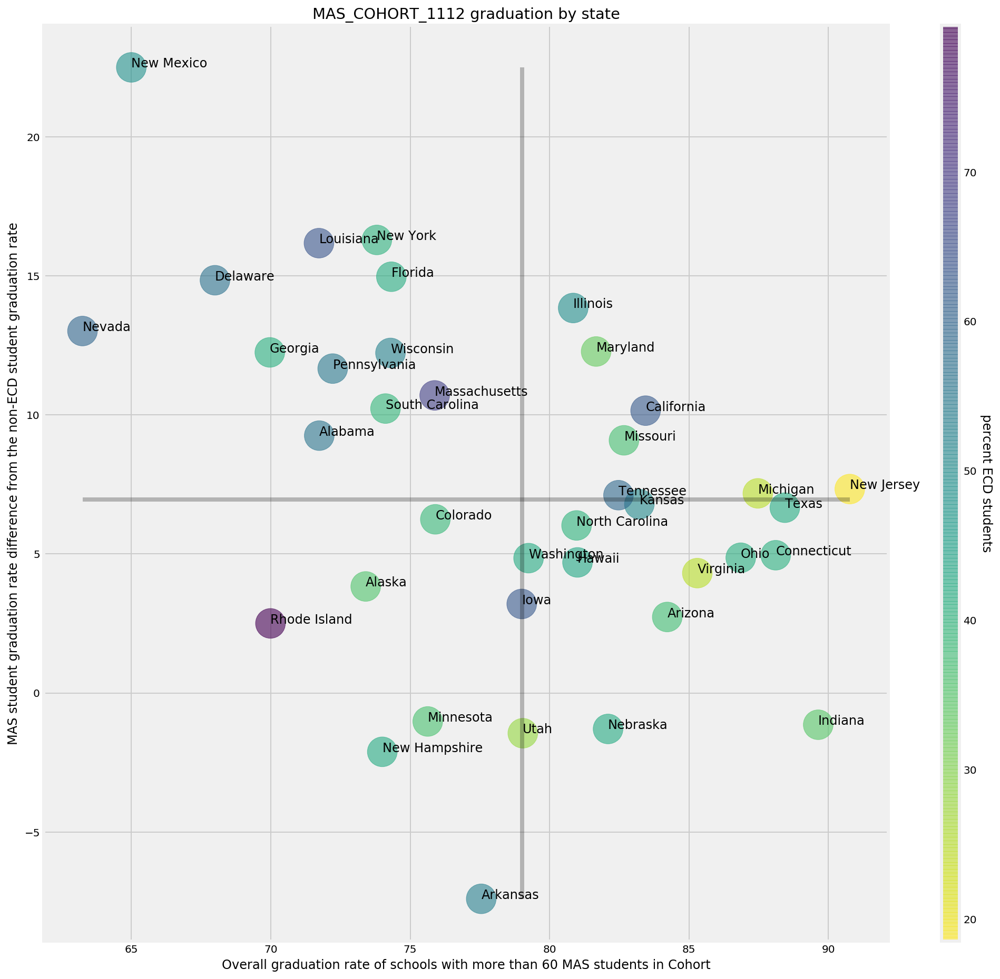

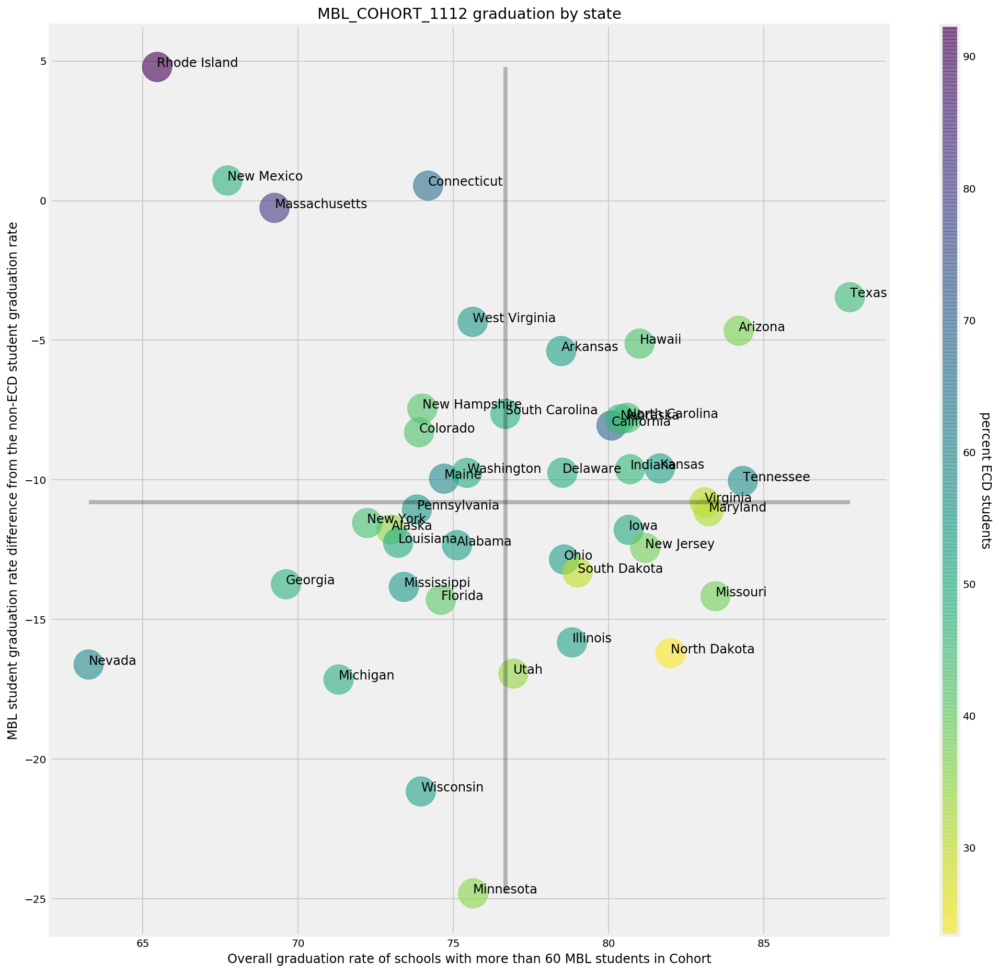

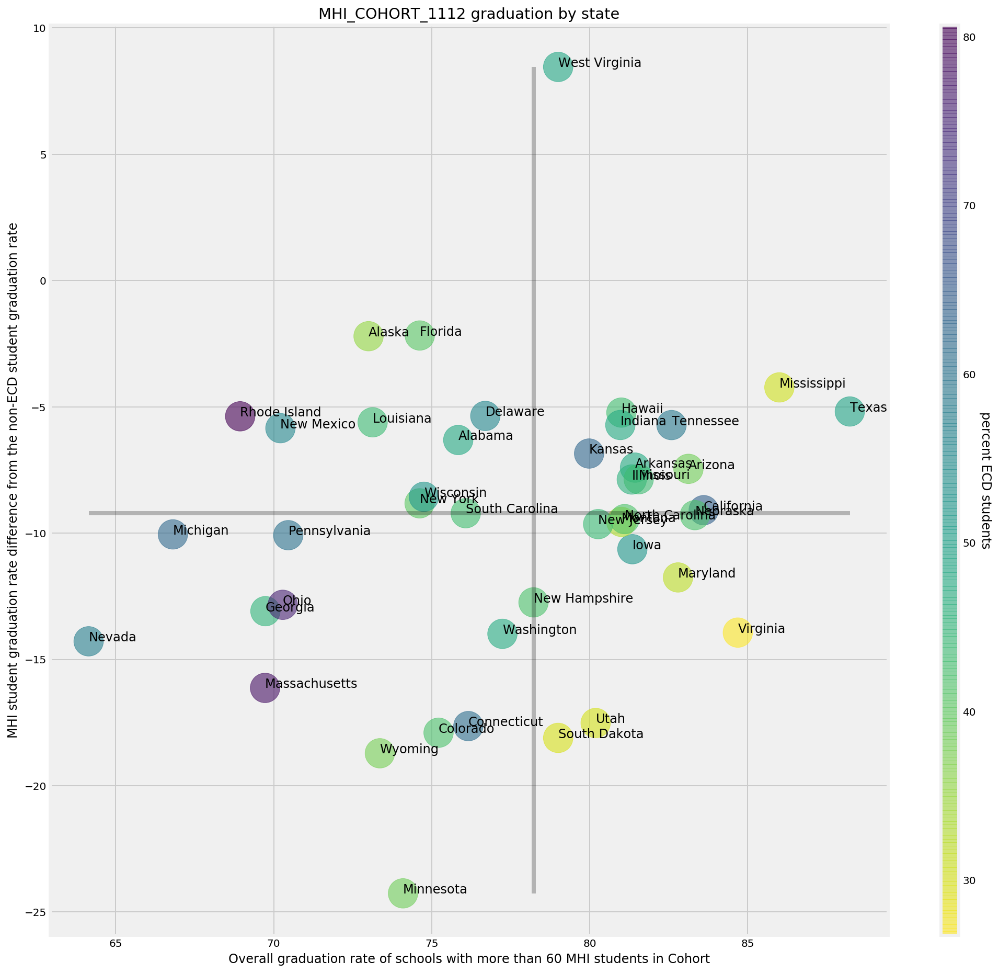

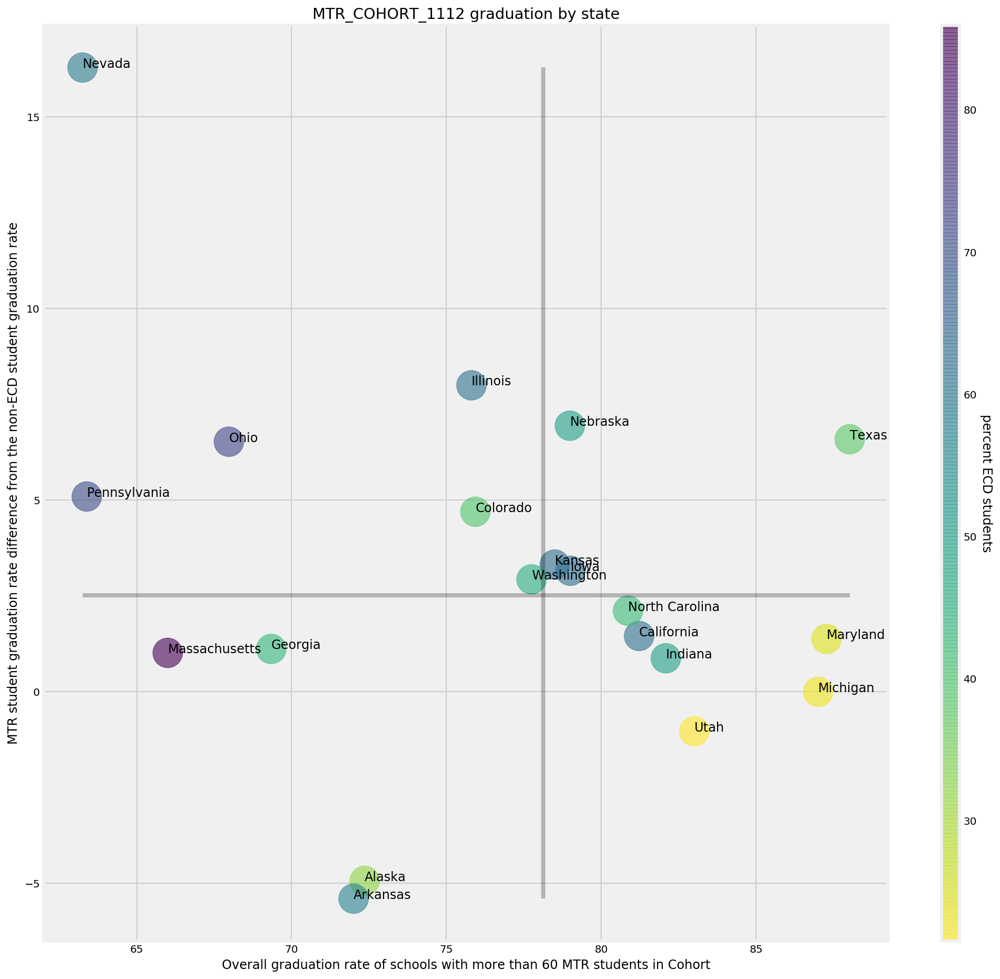

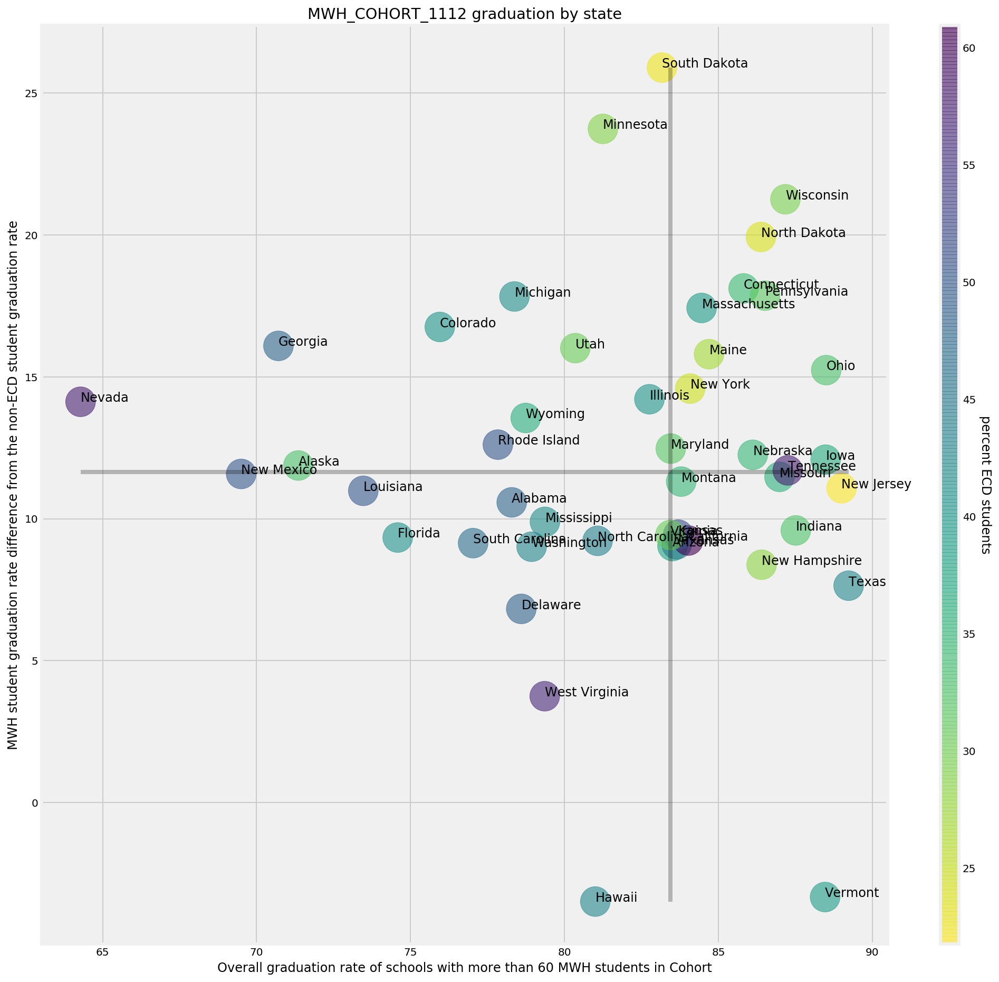

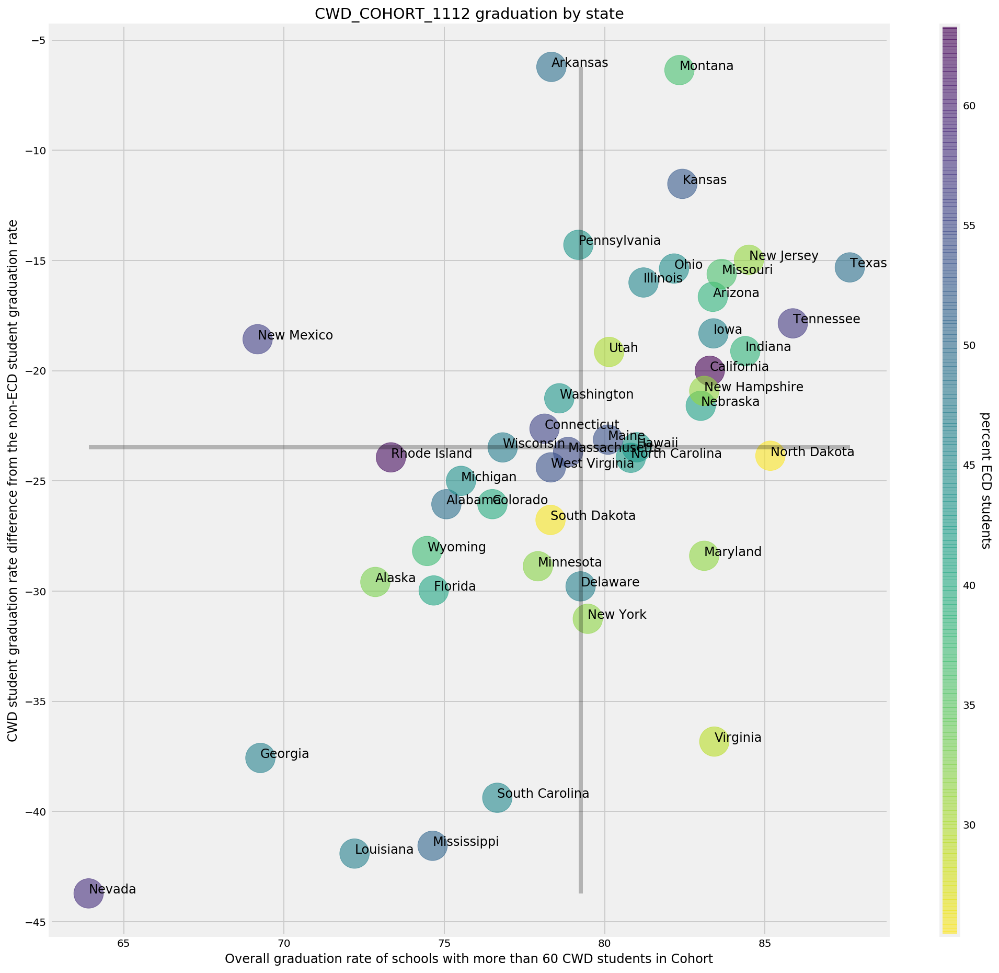

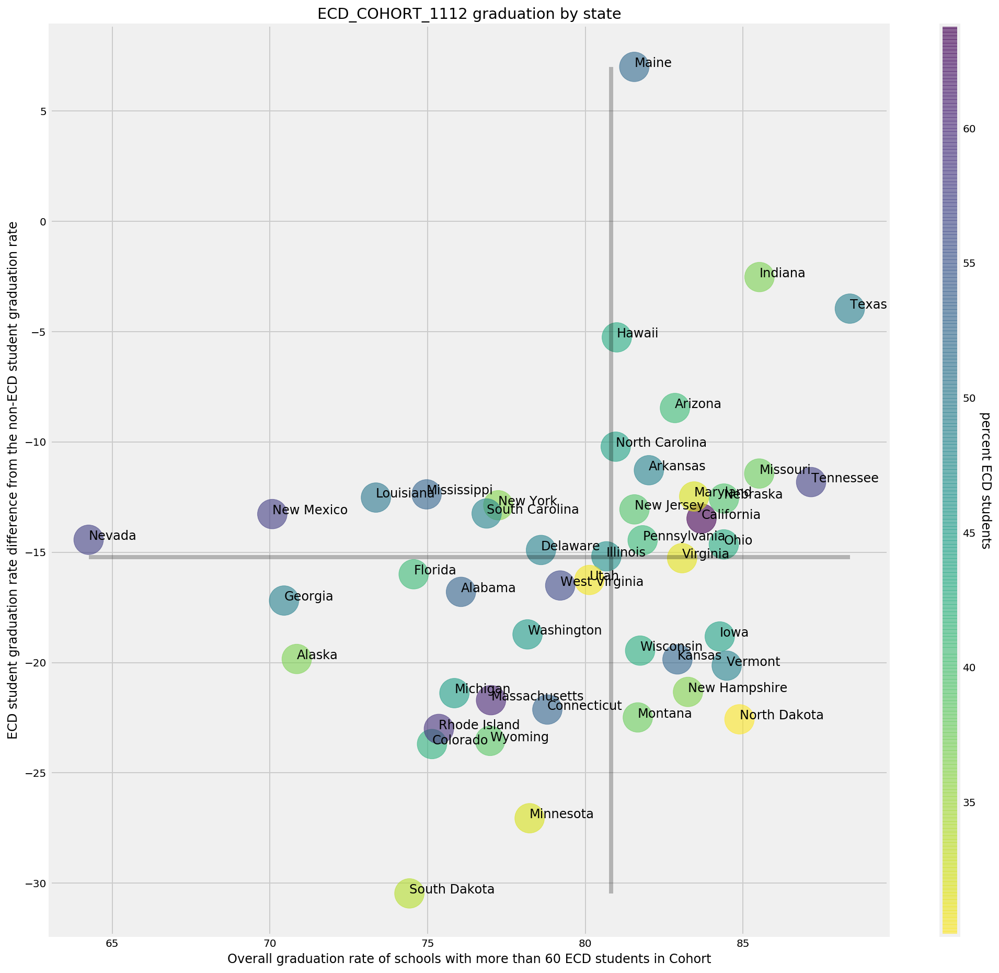

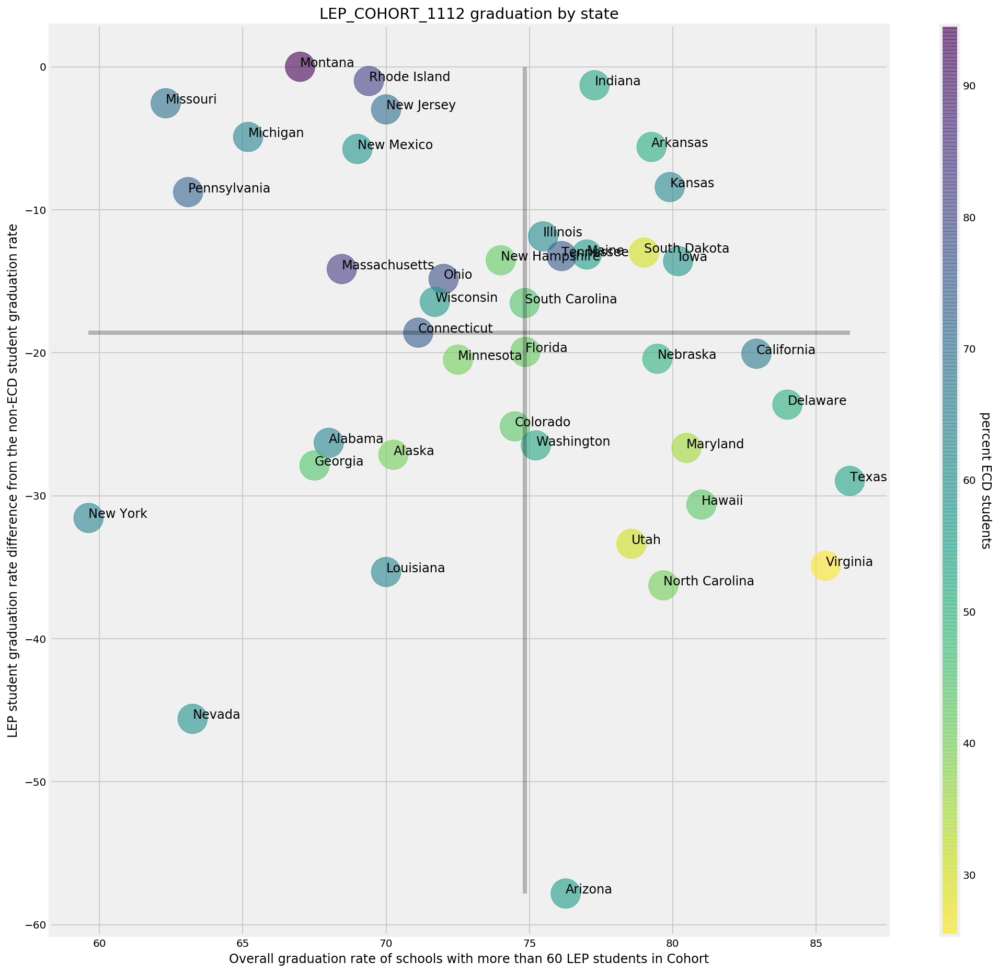

In [123]:
for col in cohort_col:
    data_plotter_by_state(grad_rate_states, col, scale_size=False, title=f'{col} graduation by state')
    plt.savefig(f'Figures/{col}_gradiation_rate_by_state')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


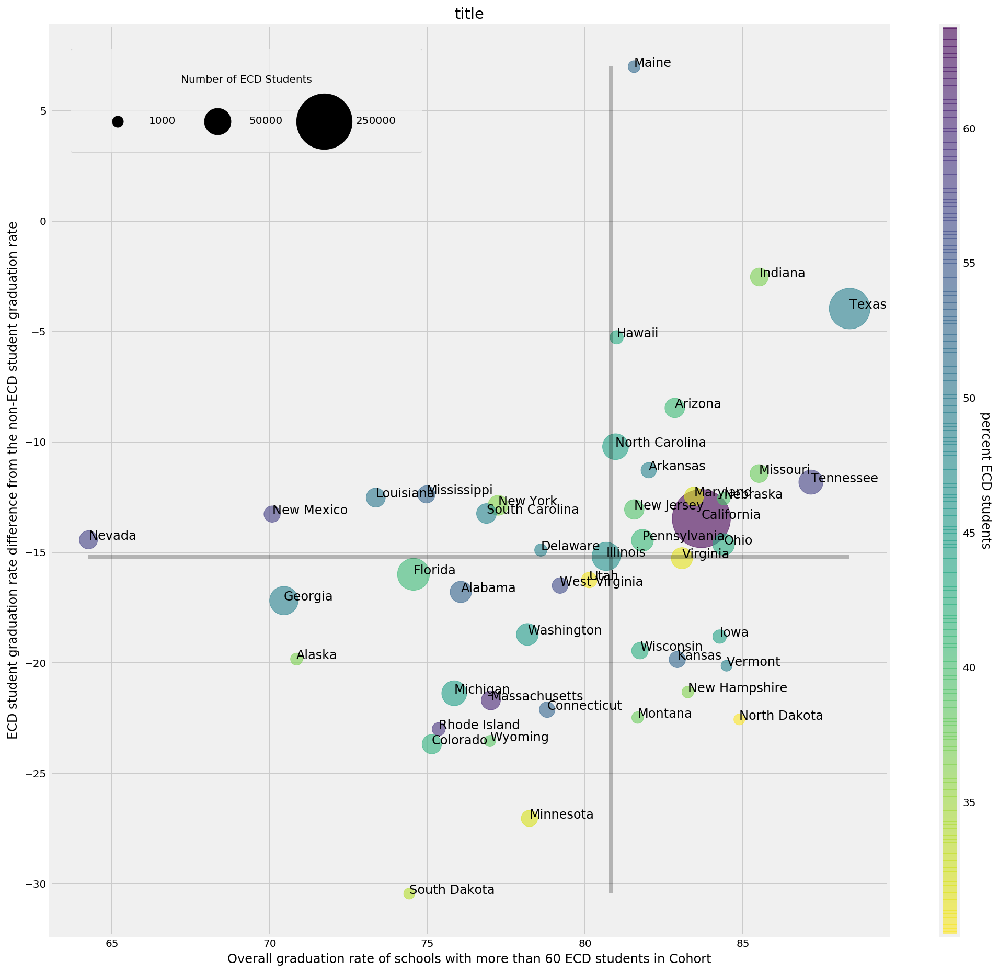

In [156]:
data_plotter_by_state(grad_rate_states, 'ECD_COHORT_1112', scale_size=True, title='ECD graduation by state')

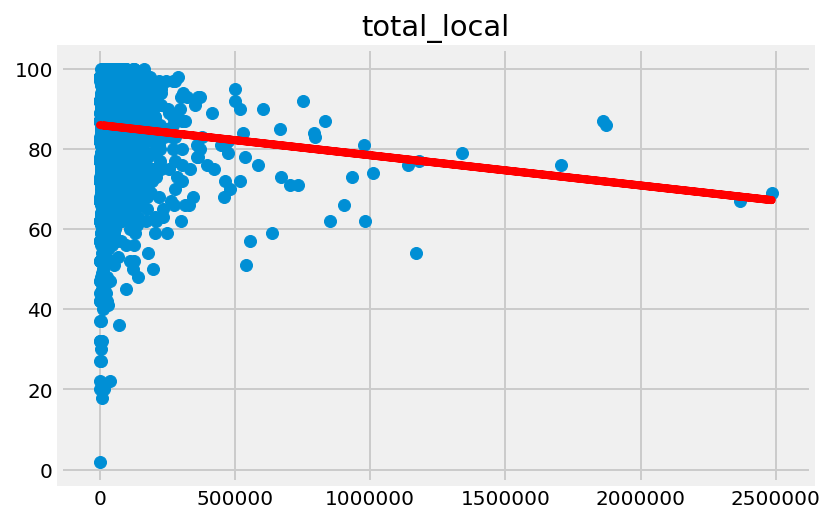

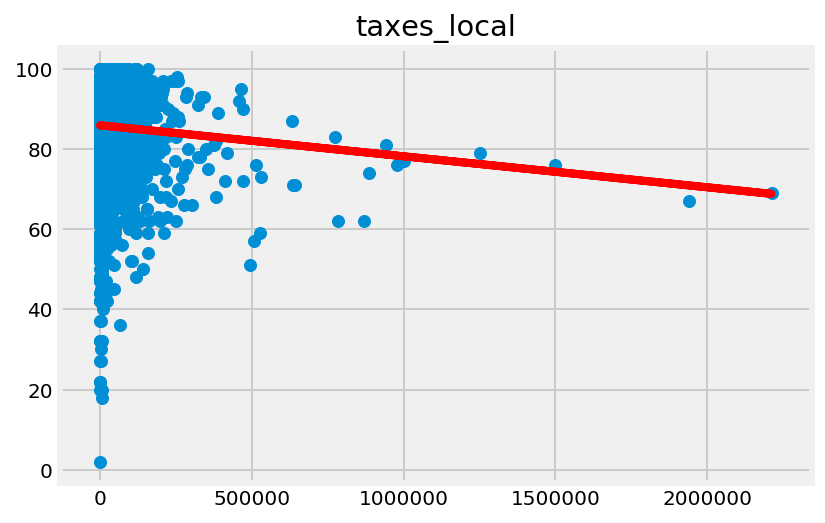

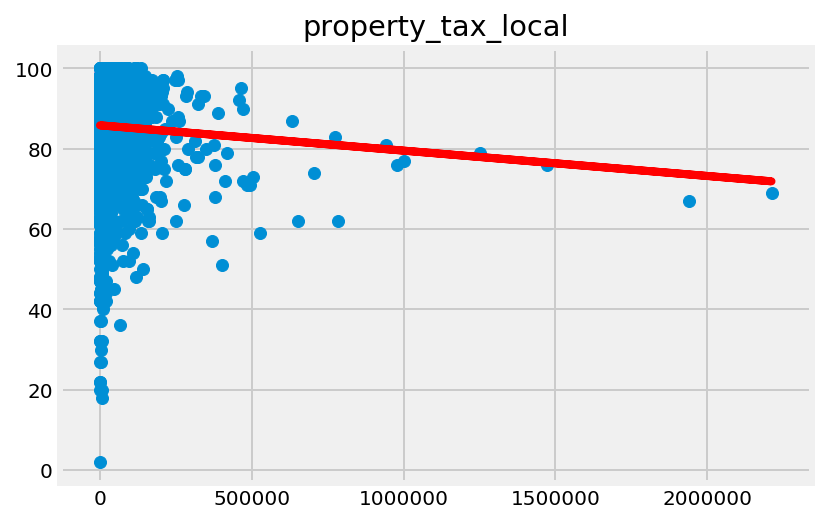

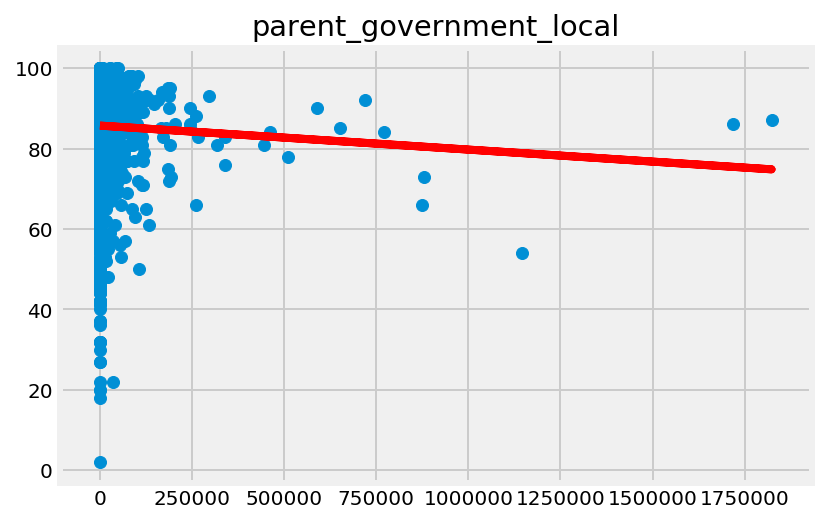

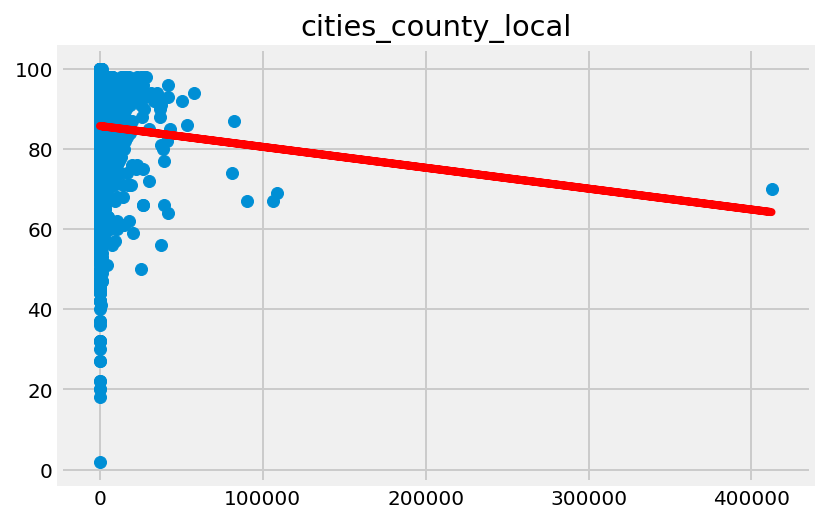

...

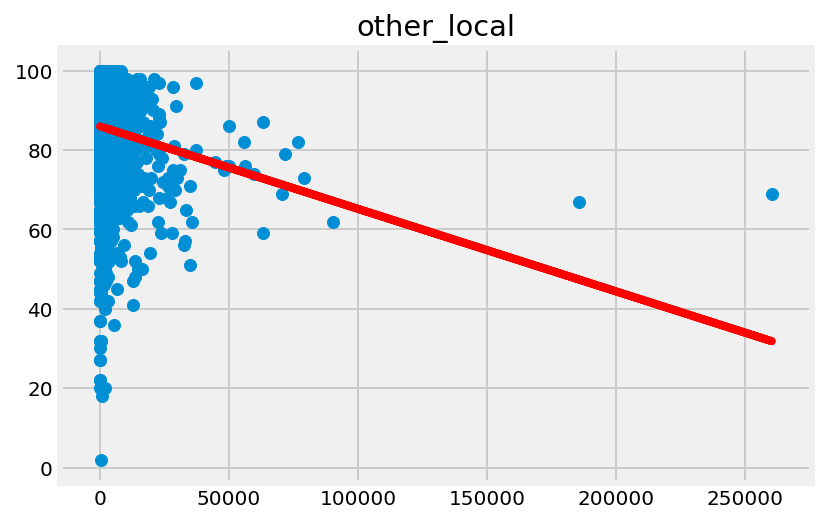

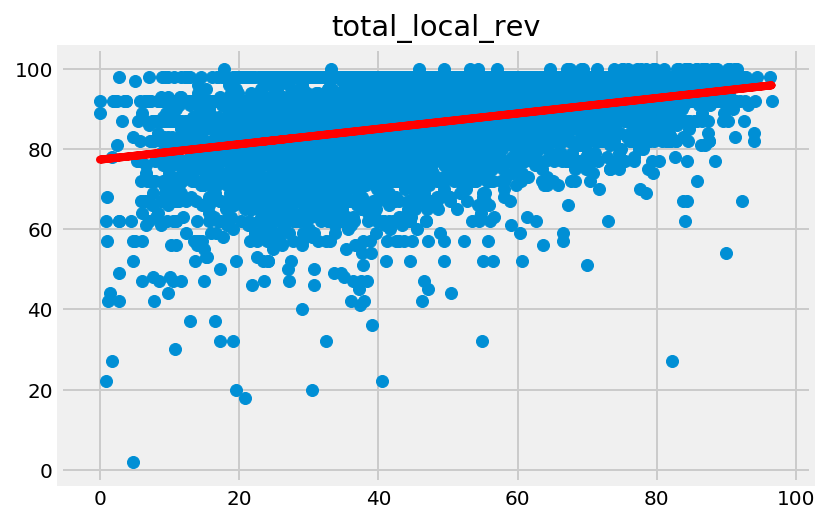

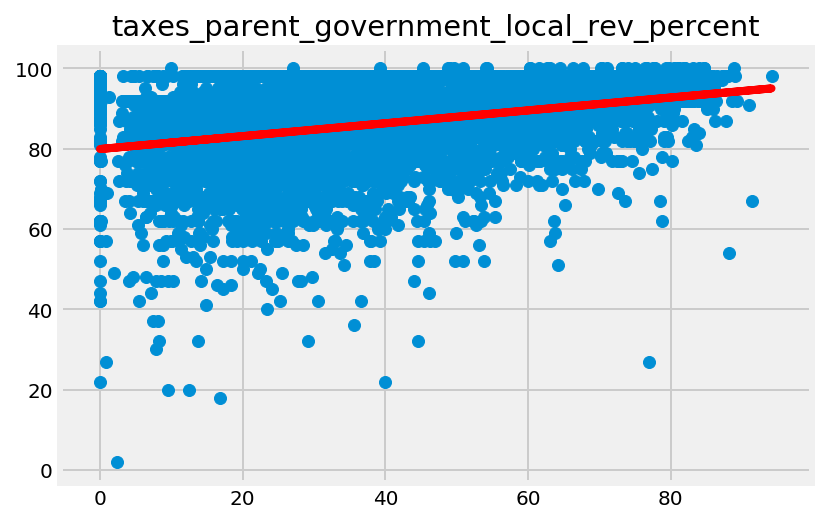

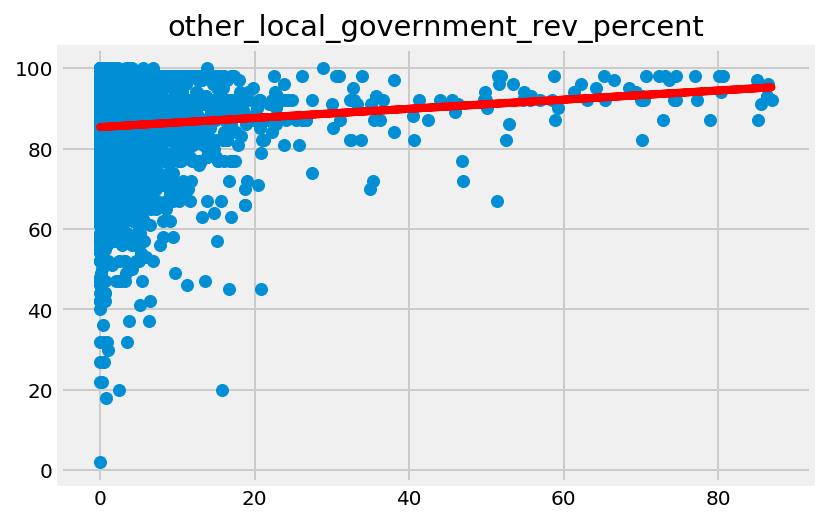

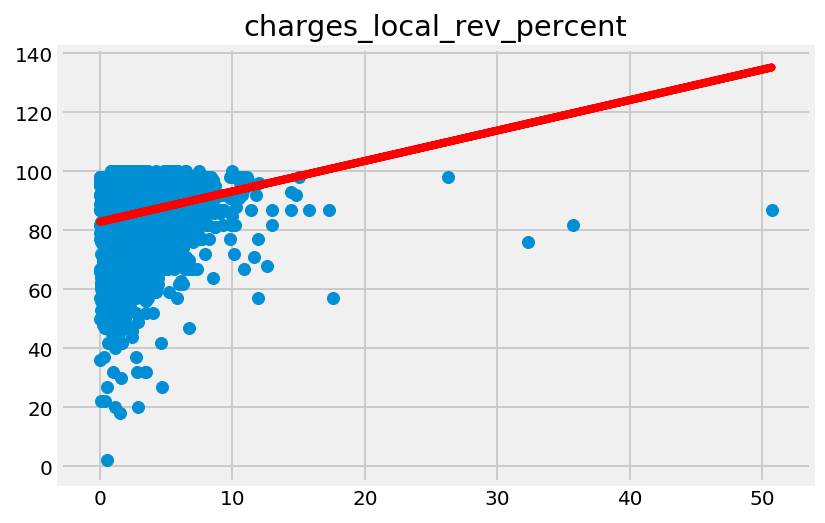

In [124]:
for col in [col for col in super_combined.columns if 'local' in col]:

    x = super_combined[col]
    y = super_combined['ALL_RATE_1112']

    fig, ax = plt.subplots()
    reg_line = np.polyfit(x, y, deg=1)
    ax.plot(x, reg_line[0] * x + reg_line[1], color='red')
    ax.scatter(x, y)
    ax.set_title(col)

In [6]:
# creates a generic school that is the mean of all schools.
generic_school = pd.DataFrame(super_combined.mean()).T
gs_ecd = generic_school['percent_ECD_COHORT_1112']

# creates a df of the same school with different percent_ECD_values
ecd_values = np.linspace(0, 100, 21)
df = pd.concat([generic_school] * 21)
df['percent_ECD_COHORT_1112'] = ecd_values

# makes predictions on graduation rate as percent_ECD changes
predictions = gs.predict(df[features])

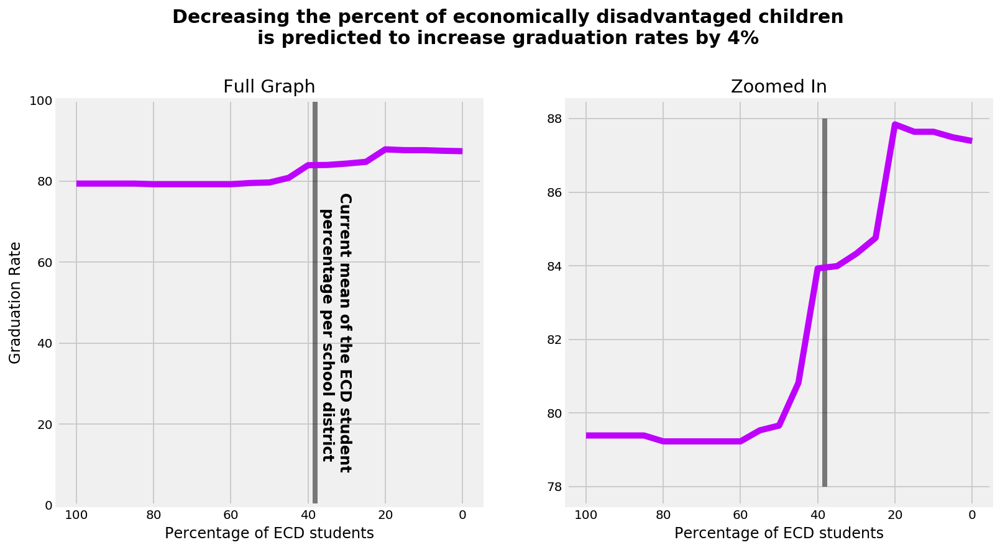

In [600]:
# plots the predicted graduation rate of a school as percent_ECD changes
fig, ax = plt.subplots(1, 2, figsize=(12, 6), sharex=True)
plt.subplots_adjust(hspace=0.1)
plt.suptitle('Decreasing the percent of economically disadvantaged children\nis predicted to increase graduation rates by 4%',
            fontsize=15, weight='bold', y=1.05)

# first ax
ax[0].set_title('Full Graph')
ax[0].set(ylabel='Graduation Rate')
ax[0].set_xlabel('Percentage of ECD students')
ax[0].plot(np.linspace(0, 100, 21), predictions, c='xkcd:bright purple', lw=5)
ax[0].vlines(gs_ecd.values, 0, 100, alpha=0.5)
ax[0].set(ylim=(0, 100))
ax[0].annotate('Current mean of the ECD student\n   percentage per school district', \
               (37, 70), rotation=270, weight='bold', fontsize=12)

# second ax
ax[1].invert_xaxis()
ax[1].plot(np.linspace(0, 100, 21), predictions, c='xkcd:bright purple', lw=5)
ax[1].plot(np.linspace(0, 100, 21), predictions, c='xkcd:bright purple', lw=5)
ax[1].vlines(gs_ecd.values, 78, 88, alpha=0.5)
ax[1].set_title('Zoomed In')
ax[1].set_xlabel('Percentage of ECD students')
plt.savefig('../project-3/Figures/Predicted_graduation_rates_with_ECD_percentage')

# Simple model
`A simple model using selected features. The percentage of Economically Disadvantaged Students was by far still the most import feature. The decreased best_score_ and score imply that the other selected columns are not heavily important to the model and do not necessarily directly affect graduation rates.`

In [241]:
simple = super_combined[['percent_ECD_COHORT_1112', 'total_rev_fed_percent', 'total_state_percent', 'total_local_rev',
                         'instruction_salary_wages_per_pupil', 'Aggregate_HH_INC_ACS_08_12', 
                         'Med_House_value_ACS_08_12', 'ALL_RATE_1112']]

In [261]:
features = [col for col in simple.columns if 'RATE' not in col]
X = simple[features]
y = simple['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=2018)

simple_rf = RandomForestRegressor()

params = {
    'n_estimators': [200],
    'max_depth': [None, 1, 3, 5],
    
}

simple_gs = GridSearchCV(simple_rf, params, n_jobs=-1, verbose=1)

simple_gs.fit(X_train, y_train)

print(simple_gs.best_score_)
simple_gs.best_params_

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:   10.1s finished


0.396869305626


{'max_depth': None, 'n_estimators': 200}

In [262]:
simple_gs.score(X_test, y_test)

0.32323700928581289

# A model without percent_ECD_COHORT_1112
`This model was made using all of the features I originally used in the randomforest regressor except the percent_ECD_COHORT_1112 column. The training score and the test score decreased by and r2 value of around 0.03, but remain relatively high, despite dropping the most import feature for the previous models. This implies that the model is able to compensate for droppping percent_ECD_COHORT_1112 with other features. This like implies that many of the features in my model are highly correlated and therefore functionally redundant with percent_ECD_COHORT_1112`

In [263]:
no_rate = [col for col in super_combined.columns if 'RATE' not in col]
no_ecd = [col for col in no_rate if 'ECD' not in col]
features = [col for col in no_ecd if col != 'Leaid']
X = super_combined[features]
y = super_combined['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=2018)

simple_rf = RandomForestRegressor()

params = {
    'n_estimators': [100],
    'max_depth': [None, 1, 2, 3],
    
}

simple_gs = GridSearchCV(simple_rf, params, n_jobs=-1, verbose=1)

simple_gs.fit(X_train, y_train)

print(simple_gs.best_score_)
simple_gs.best_params_

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:  1.8min finished


0.565783977934


{'max_depth': None, 'n_estimators': 100}

In [264]:
simple_gs.score(X_test, y_test)

0.49967485998071509

In [270]:
without_ECD_features = pd.DataFrame(simple_gs.best_estimator_.feature_importances_,
             columns=['importance'], 
             index=X.columns).sort_values(by='importance', ascending=False)

In [496]:
def feature_correlation_values_ALL_RATE_and_ECD(df, features):
    cols_for_corr = ['ALL_RATE_1112', 'percent_ECD_COHORT_1112']

    for col in features:
        cols_for_corr.append(col)


    ecd_corr_values = super_combined[cols_for_corr].corr()[['percent_ECD_COHORT_1112', 
                                                            'ALL_RATE_1112']]\
                                                            .sort_values(by='percent_ECD_COHORT_1112', ascending=False)
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))

    sns.heatmap(ecd_corr_values, annot=True, cmap='viridis')
    ax.set_title(f'correlations')

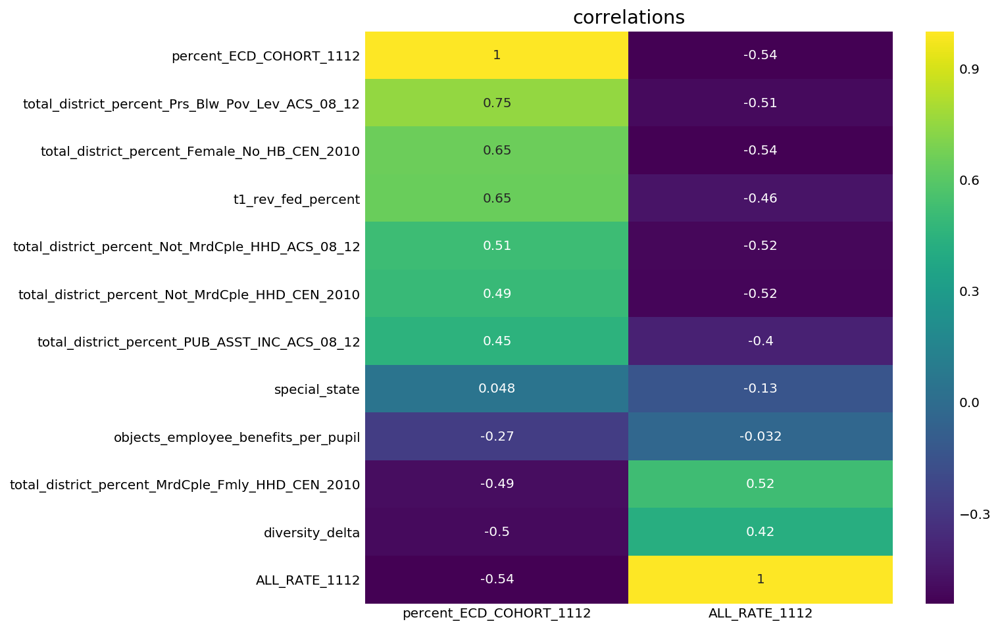

In [497]:
feature_correlation_values_ALL_RATE_and_ECD(super_combined, without_ECD_features.index[:10])
plt.savefig()

`9 out of 10 of the most important features for the model without percent_ECD_COHORT_1112 are moderately to highly correlated with percent_ECD_COHORT_1112.`

# Model without top 10 from previous model
`I made a new model with out the top 10 most important features from the previous model (without_ECD). The model still does relatively well with the features left. The most important features still are correlated with ecnomic disadvantages.`

In [274]:
X = super_combined[without_ECD_features.index[10:]]
y = super_combined['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=2018)

simple_rf = RandomForestRegressor()

params = {
    'n_estimators': [100],
    'max_depth': [None],
    
}

simple_gs = GridSearchCV(simple_rf, params, n_jobs=-1, verbose=1)

simple_gs.fit(X_train, y_train)

print(simple_gs.best_score_)
simple_gs.best_params_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:  1.2min finished


0.543799414564


{'max_depth': None, 'n_estimators': 100}

In [275]:
simple_gs.score(X_test, y_test)

0.4951395538925929

In [278]:
round_2 =  pd.DataFrame(simple_gs.best_estimator_.feature_importances_,
             columns=['importance'], 
             index=X.columns).sort_values(by='importance', ascending=False)

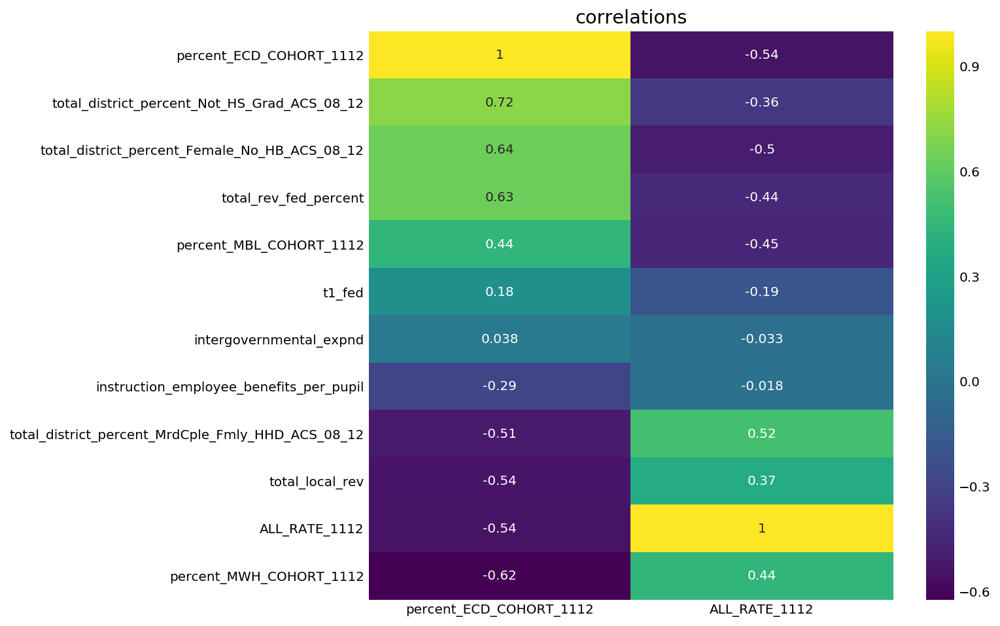

In [499]:
feature_correlation_values_ALL_RATE_and_ECD(super_combined, round_2.index[:10])

In [500]:
X = super_combined[round_2.index[10:]]
y = super_combined['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=2018)

simple_rf = RandomForestRegressor()

params = {
    'n_estimators': [100],
    'max_depth': [None],
    
}

simple_gs = GridSearchCV(simple_rf, params, n_jobs=-1, verbose=1)

simple_gs.fit(X_train, y_train)

print(simple_gs.best_score_)
simple_gs.best_params_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:  1.2min finished


0.51559985066


{'max_depth': None, 'n_estimators': 100}

In [501]:
simple_gs.score(X_test, y_test)

0.46257795033740112

In [502]:
round_3 = pd.DataFrame(simple_gs.best_estimator_.feature_importances_,
             columns=['importance'], 
             index=X.columns).sort_values(by='importance', ascending=False)

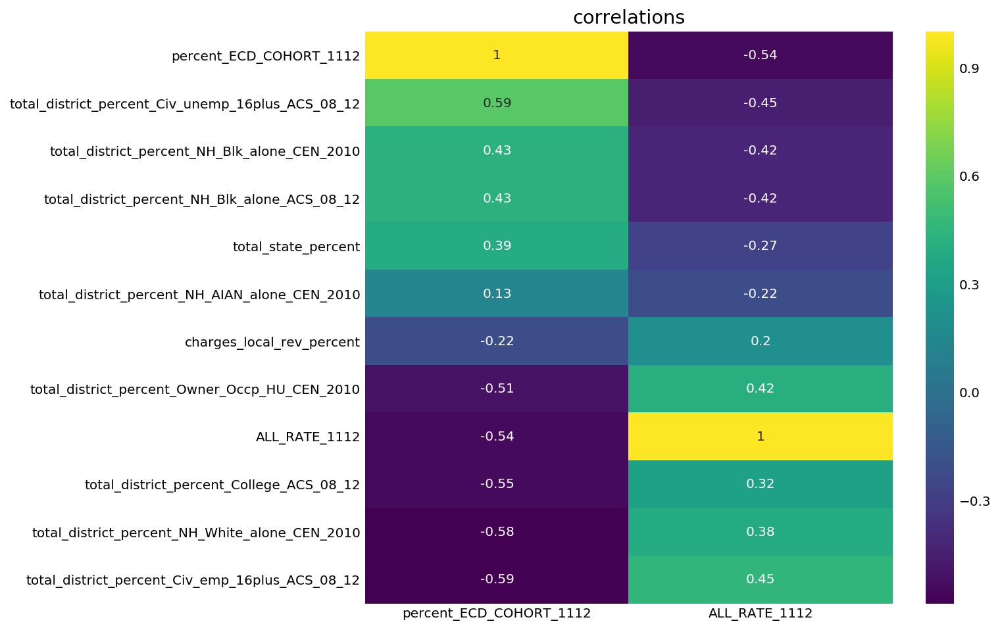

In [503]:
feature_correlation_values_ALL_RATE_and_ECD(super_combined, round_3.index[:10])

# Model with features weakly  correlated with ECD percent

In [505]:
ecd_corr_df = super_combined.corr()[['percent_ECD_COHORT_1112']]

In [539]:
len(ecd_corr_df.loc[abs(ecd_corr_df['percent_ECD_COHORT_1112']) > 0.1]) # num of moderately correlated features

117

In [540]:
non_ecd_correlated_features = ecd_corr_df.loc[abs(ecd_corr_df['percent_ECD_COHORT_1112']) <= .1]

In [ ]:
# tried a correlation of .2, most import feature was t1_fed, which had a correlation value of 

In [544]:
super_combined[['percent_ECD_COHORT_1112', 't1_fed']].corr()

,percent_ECD_COHORT_1112,t1_fed
percent_ECD_COHORT_1112,1.000000,0.183628
t1_fed,0.183628,1.000000


In [541]:
X = super_combined[non_ecd_correlated_features.index]
y = super_combined['ALL_RATE_1112']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=2018)

simple_rf = RandomForestRegressor()

params = {
    'n_estimators': [100],
    'max_depth': [None],
    
}

simple_gs = GridSearchCV(simple_rf, params, n_jobs=-1, verbose=1)

simple_gs.fit(X_train, y_train)

print(simple_gs.best_score_)
simple_gs.best_params_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   31.3s finished


0.396532436317


{'max_depth': None, 'n_estimators': 100}

In [542]:
simple_gs.score(X_test, y_test)

0.37352507775961219

In [543]:
non_ecd_corr_fetaures = pd.DataFrame(simple_gs.best_estimator_.feature_importances_, index=X.columns).sort_values(by=0, ascending=False)

In [548]:
non_ecd_corr_fetaures

,0
intergovernmental_expnd,7.681651e-02
special_state,3.731442e-02
total_district_percent_MLT_U2_9_STRC_ACS_08_12,3.626322e-02
charges_local,3.501345e-02
total_local,2.846722e-02
percent_CWD_COHORT_1112,2.527489e-02
total_district_percent_Pop_5_17_CEN_2010,2.386774e-02
non_spec_state,2.361671e-02
total_district_percent_Age5p_NativeNAm_ACS_08_12,2.340303e-02
services_general_administration_expnd,2.191295e-02


In [547]:
(non_ecd_corr_fetaures >= 0.01).sum()

0    39
dtype: int64

`Overall, the model without ecd_correlated features (greater than 0.1 correlation value) is about .15 worse at predicting graduation rate in the test data set. Many of the top features were features relating to school funding. However, most of these features were not significantly valued over the other features. The top 39 features had an importance value of between 0.01 and 0.1. School revenue sources comprised a significant portion of the top values. The population age and the population institutionalized were also in the top features.`

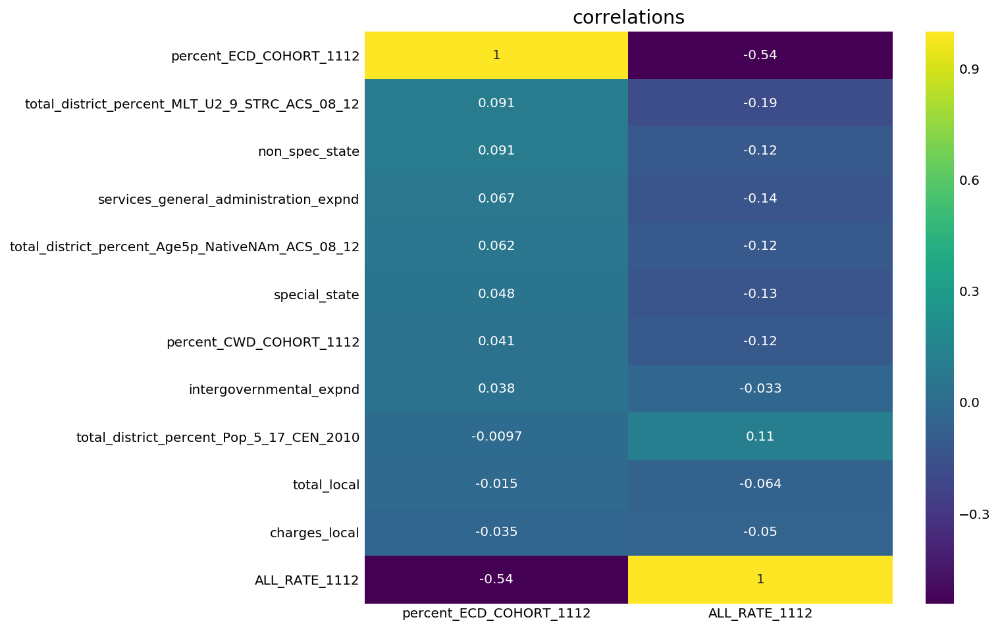

In [549]:
feature_correlation_values_ALL_RATE_and_ECD(super_combined, non_ecd_corr_fetaures.index[:10])